# 1- Classification with XGBoost

## 1- Welcome to the course!


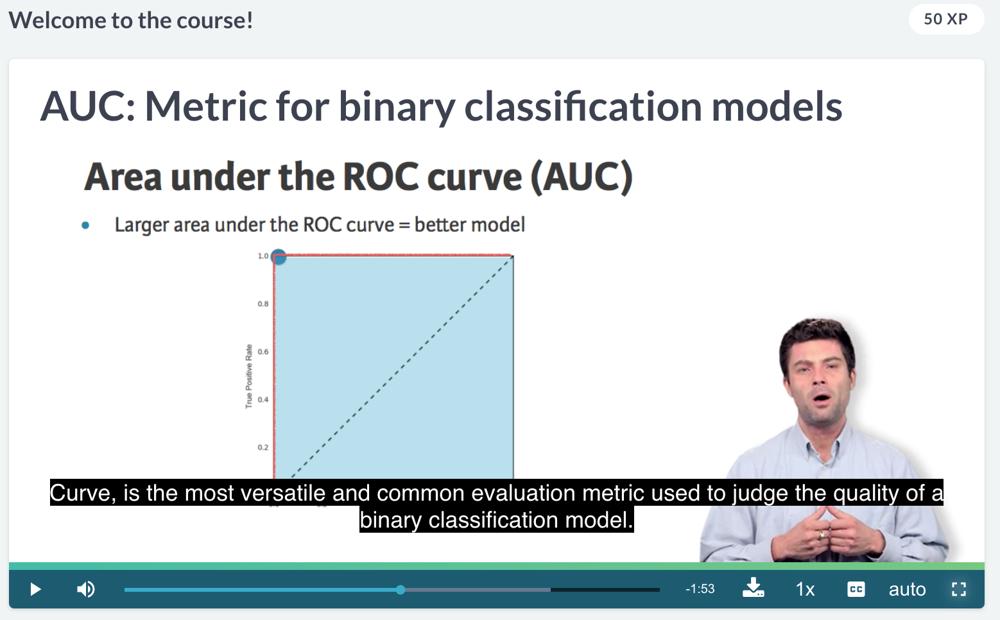

In [1]:
from IPython.display import Image
Image(filename= '1.png')

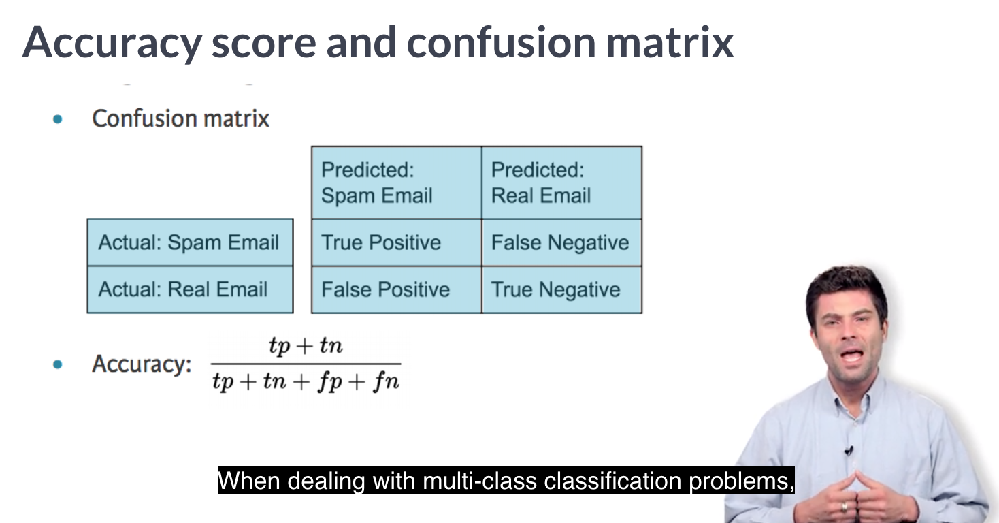

In [2]:
Image(filename= '2.png')

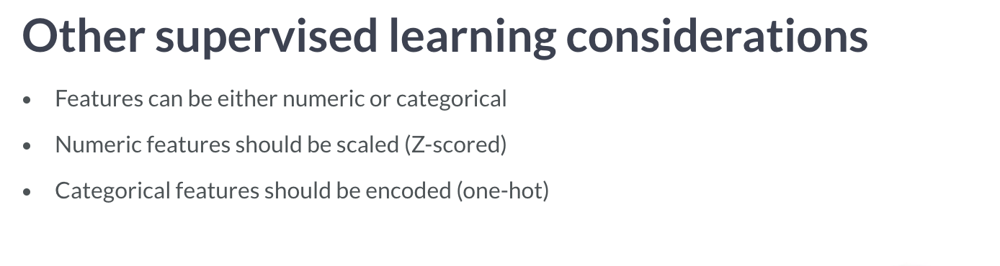

In [3]:
Image(filename= '3.png')

## The hottest library in supervised machine learning is`XG Boost`

## 2- Introducing XGBoost


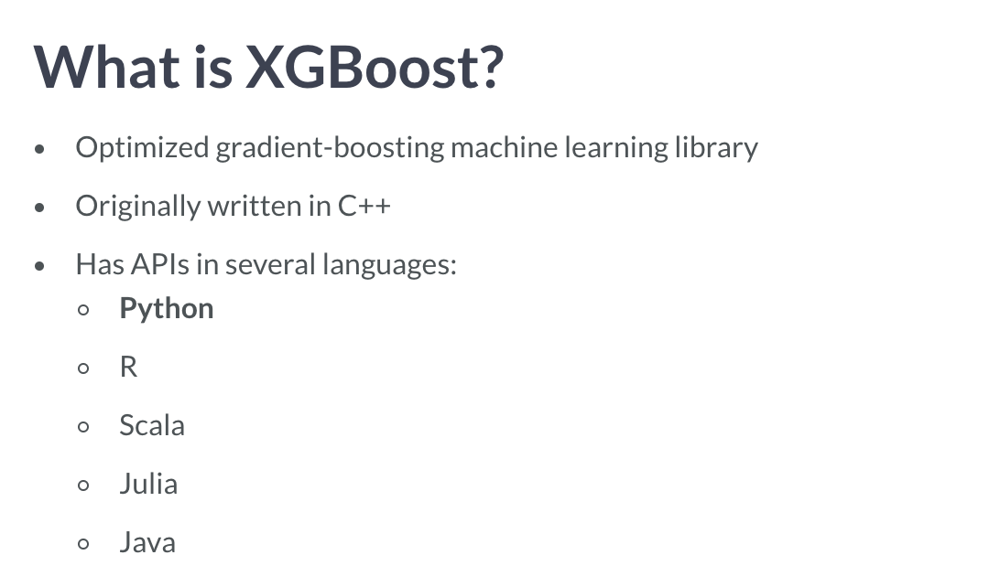

In [7]:
Image(filename= '4.png')

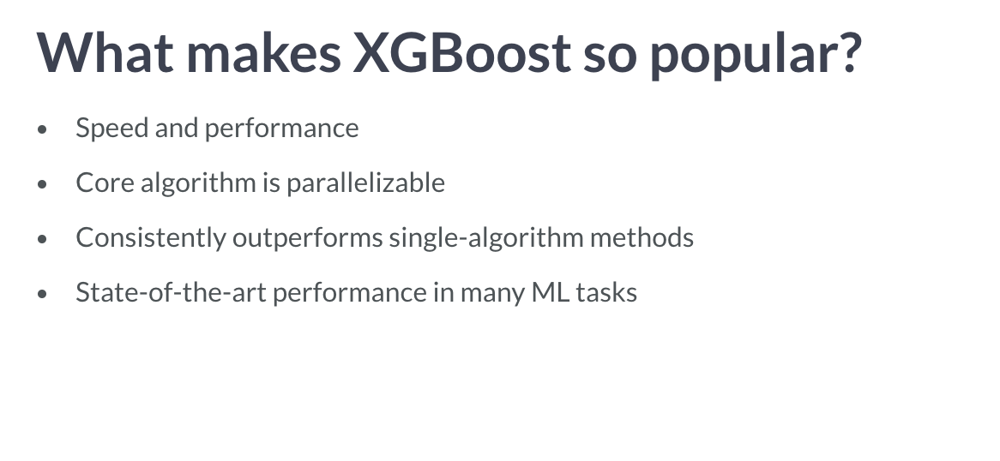

In [8]:
Image(filename= '5.png')

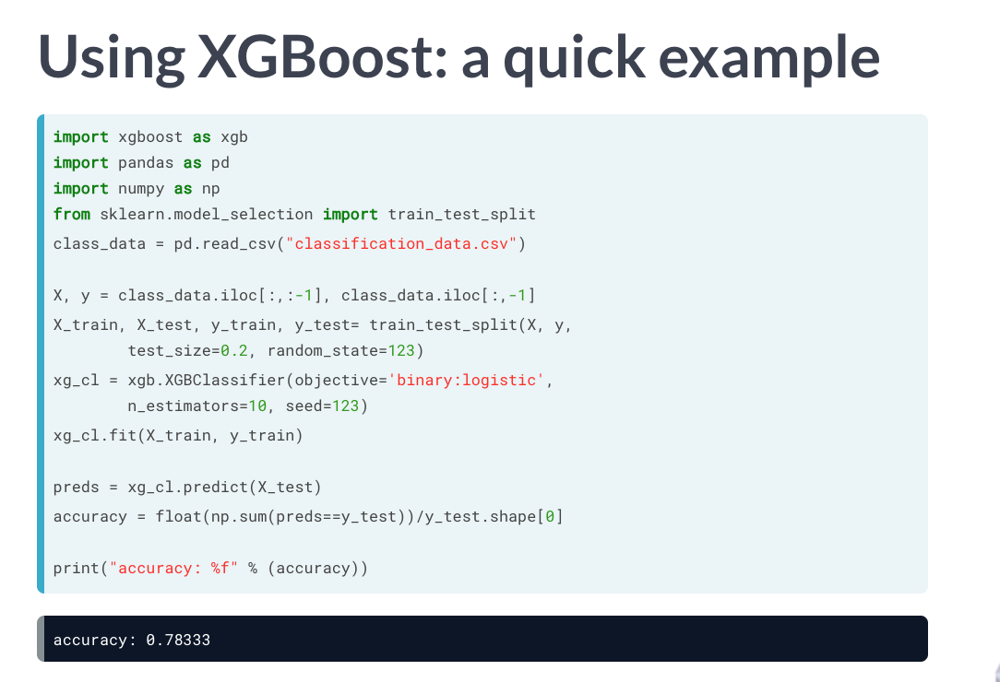

In [9]:
Image(filename= '6.png')

In [47]:
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier


In [48]:
class_data = pd.read_csv('Diabetes.csv')
class_data.head()

,pregnancies,glucose,diastolic,triceps,insulin,bmi,dpf,age,diabetes
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [49]:
X, y = class_data.iloc[:,:-1].values , class_data.iloc[:,-1].values
X_train, X_test, y_train, y_test = train_test_split(X,y ,test_size = 0.2, random_state=123)


In [58]:
dt_clf = DecisionTreeClassifier(max_depth=4, random_state=123)
dt_clf.fit(X_train, y_train)
y_pred = dt_clf.predict(X_test)
accuracy_dt = float(np.sum(y_pred==y_test))/y_test.shape[0]
print('the Accuracy for Decision Tree is {:.2f}:'.format(accuracy_dt))


the Accuracy for Decision Tree is 0.77:


In [59]:
xgb_clf = xgb.XGBClassifier(objective='binary:logistic', n_estimators=10, random_state=123)
xgb_clf.fit(X_train, y_train)
xgb_preds = xgb_clf.predict(X_test)
accuracy_xgb = float(np.sum(xgb_preds == y_test))/y_test.shape[0]
print('the Accuracy for XGBoost is {:.2f}:'.format(accuracy_xgb))


the Accuracy for XGBoost is 0.77:


In [ ]:
# # Import xgboost
# import xgboost as xgb

# # Create arrays for the features and the target: X, y
# X, y = churn_data.iloc[:,:-1], churn_data.iloc[:,-1]

# # Create the training and test sets
# X_train, X_test, y_train, y_test= train_test_split(X, y, test_size=0.2, random_state=123)

# # Instantiate the XGBClassifier: xg_cl
# xg_cl = xgb.XGBClassifier(objective='binary:logistic', n_estimators=10, seed=123)

# # Fit the classifier to the training set
# xg_cl.fit(X_train, y_train)

# # Predict the labels of the test set: preds
# preds = xg_cl.predict(X_test)

# # Compute the accuracy: accuracy
# accuracy = float(np.sum(preds==y_test))/y_test.shape[0]
# print("accuracy: %f" % (accuracy))


#     accuracy: 0.743300


## 3- What is a decision tree?


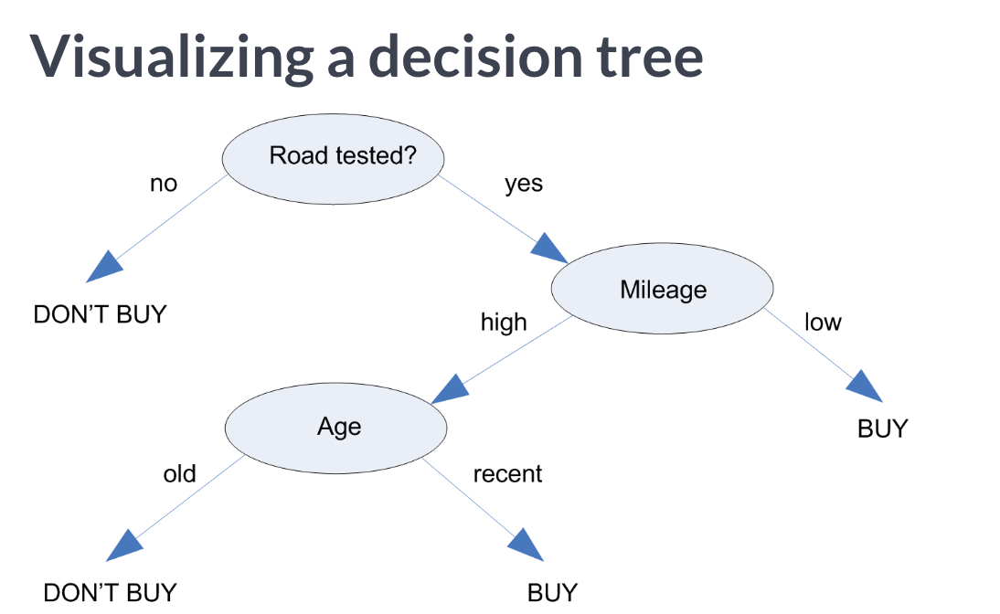

In [10]:
Image(filename= '7.png')

In [ ]:
# # Import the necessary modules
# from sklearn.model_selection import train_test_split
# from sklearn.tree import DecisionTreeClassifier

# # Create the training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=123)

# # Instantiate the classifier: dt_clf_4
# dt_clf_4 = DecisionTreeClassifier(max_depth = 4)

# # Fit the classifier to the training set
# dt_clf_4.fit(X_train, y_train)

# # Predict the labels of the test set: y_pred_4
# y_pred_4 = dt_clf_4.predict(X_test)

# # Compute the accuracy of the predictions: accuracy

# accuracy = float(np.sum(y_pred_4==y_test))/y_test.shape[0]
# print("accuracy:", accuracy)

# accuracy: 0.9649122807017544


## 4- What is Boosting?


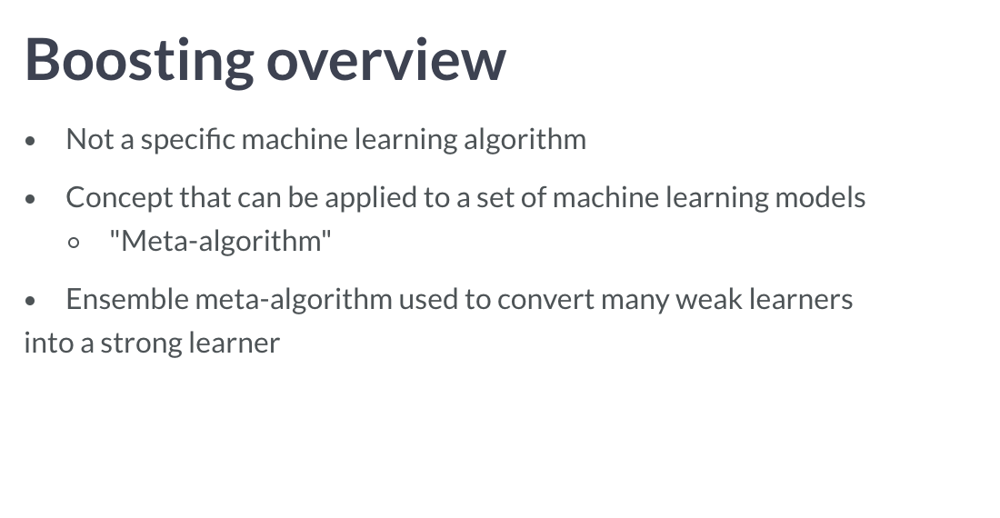

In [11]:
Image(filename= '8.png')

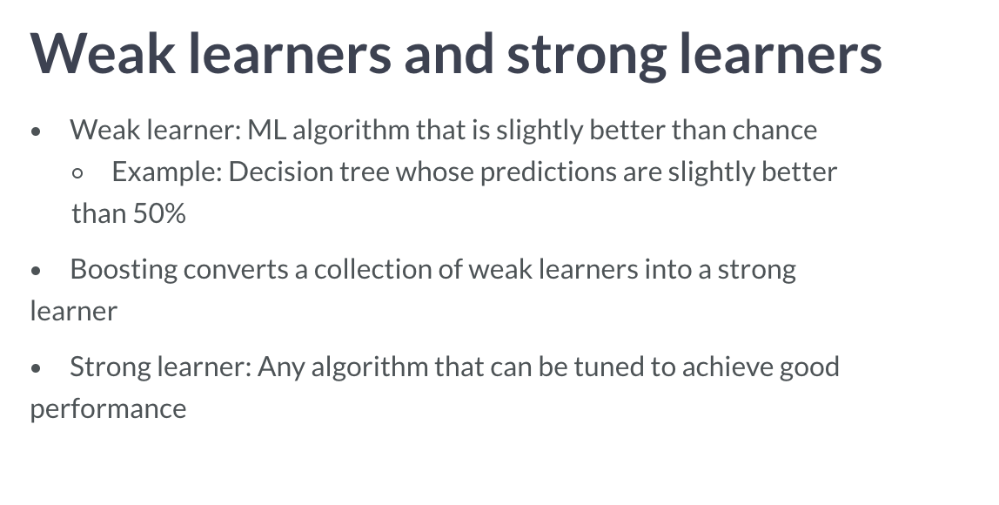

In [12]:
Image(filename= '9.png')

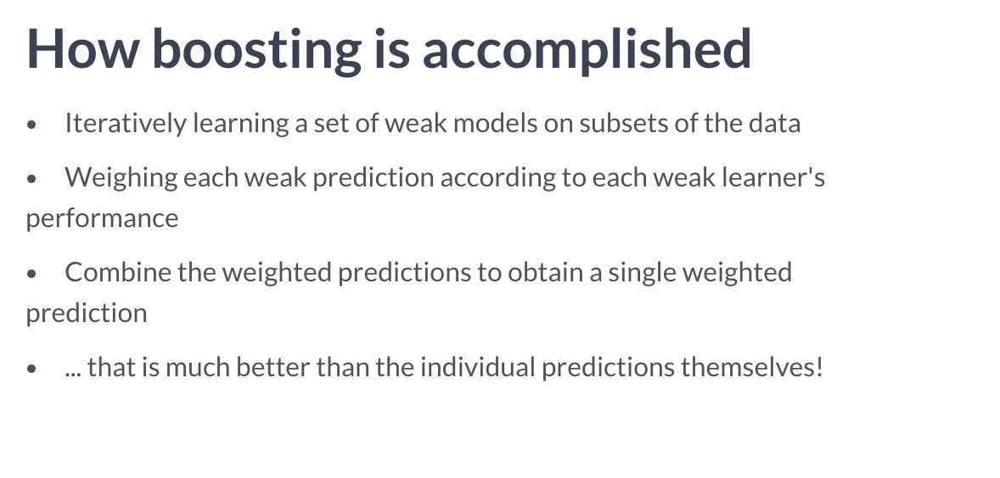

In [13]:
Image(filename= '10.png')

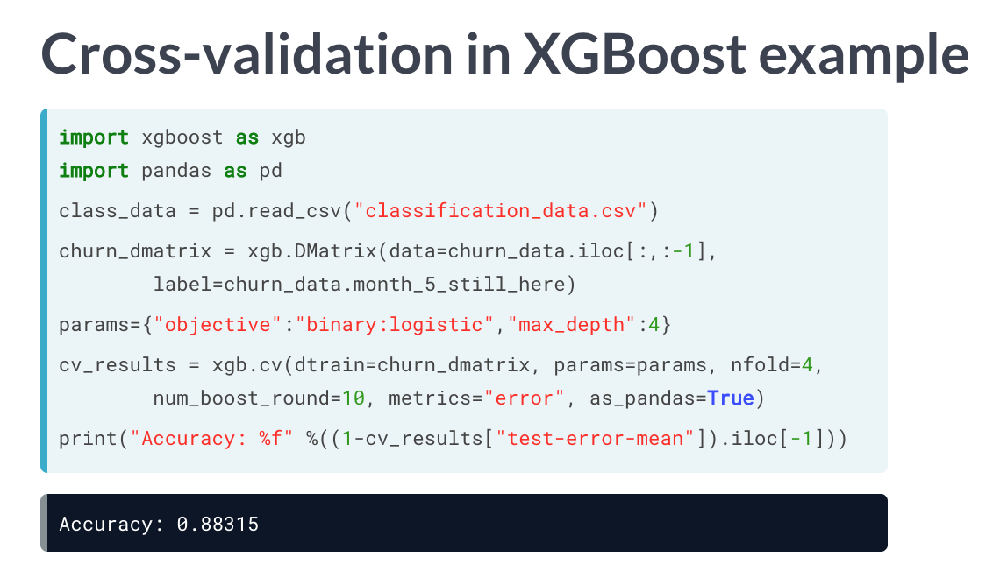

In [14]:
Image(filename= '11.png')

In [60]:
import xgboost as xgb
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier


In [61]:
class_data = pd.read_csv('Diabetes.csv')
class_data.head()

,pregnancies,glucose,diastolic,triceps,insulin,bmi,dpf,age,diabetes
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [62]:
churn_dmatrix = xgb.DMatrix(data=class_data.iloc[:,:-1],
                           label=class_data.iloc[:,-1])


/Users/fox/anaconda3/envs/newEnv/lib/python3.7/site-packages/xgboost/core.py:587: FutureWarning: Series.base is deprecated and will be removed in a future version
  if getattr(data, 'base', None) is not None and \
/Users/fox/anaconda3/envs/newEnv/lib/python3.7/site-packages/xgboost/core.py:588: FutureWarning: Series.base is deprecated and will be removed in a future version
  data.base is not None and isinstance(data, np.ndarray) \


In [65]:
params = {'objective':'binary:logistic', 'max_depth':4, 'random_state':123}
cv_results = xgb.cv(dtrain=churn_dmatrix, params=params,
                   nfold=4, num_boost_round=10, metrics='error',
                   as_pandas=True)

cv_results


,train-error-mean,train-error-std,test-error-mean,test-error-std
0,0.194444,0.012091,0.250000,0.034351
1,0.174479,0.010453,0.250000,0.021156
2,0.167535,0.010452,0.242187,0.026685
3,0.161458,0.009509,0.243490,0.022212
4,0.157552,0.005404,0.244792,0.030146
5,0.151042,0.010489,0.239584,0.023868
6,0.142795,0.003334,0.246093,0.025615
7,0.140191,0.007991,0.244792,0.025780
8,0.134549,0.007211,0.238281,0.023689
9,0.129774,0.009459,0.244792,0.030145


In [66]:
accuracy_xgb = 1- cv_results['test-error-mean'].iloc[-1]
accuracy_xgb

0.75520825

In [ ]:
# # Create the DMatrix: churn_dmatrix
# churn_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter dictionary: params
# params = {"objective":"reg:logistic", "max_depth":3}

# # Perform cross-validation: cv_results
# cv_results = xgb.cv(dtrain=churn_dmatrix, params=params, nfold=3, num_boost_round=5, metrics="error", as_pandas=True, seed=123)

# # Print cv_results
# print(cv_results)

# # Print the accuracy
# print(((1-cv_results["test-error-mean"]).iloc[-1]))

In [ ]:
# # Perform cross_validation: cv_results
# cv_results = xgb.cv(dtrain=churn_dmatrix, params=params, nfold=3, num_boost_round=5, metrics="auc", as_pandas=True, seed=123)

# # Print cv_results
# print(cv_results)

# # Print the AUC
# print((cv_results["test-auc-mean"]).iloc[-1])

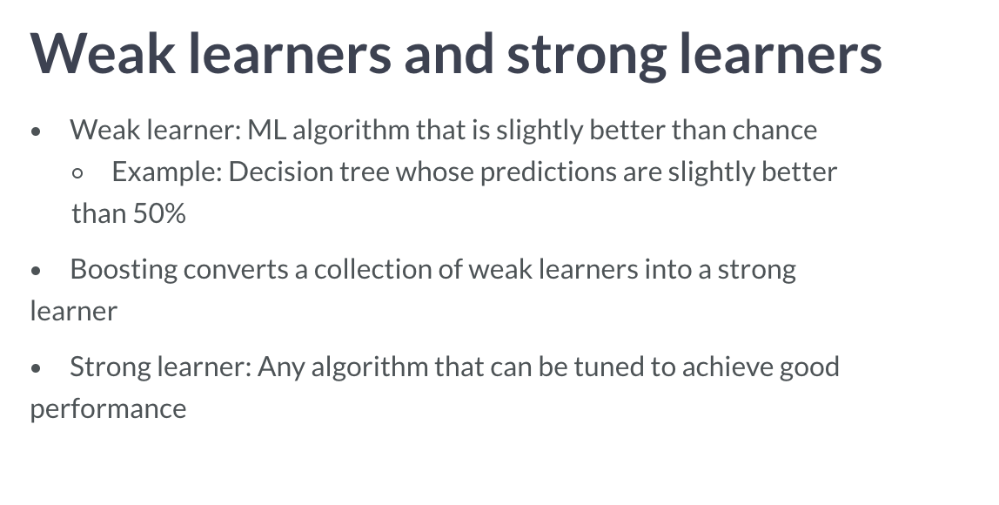

In [71]:
Image(filename= '9.png')

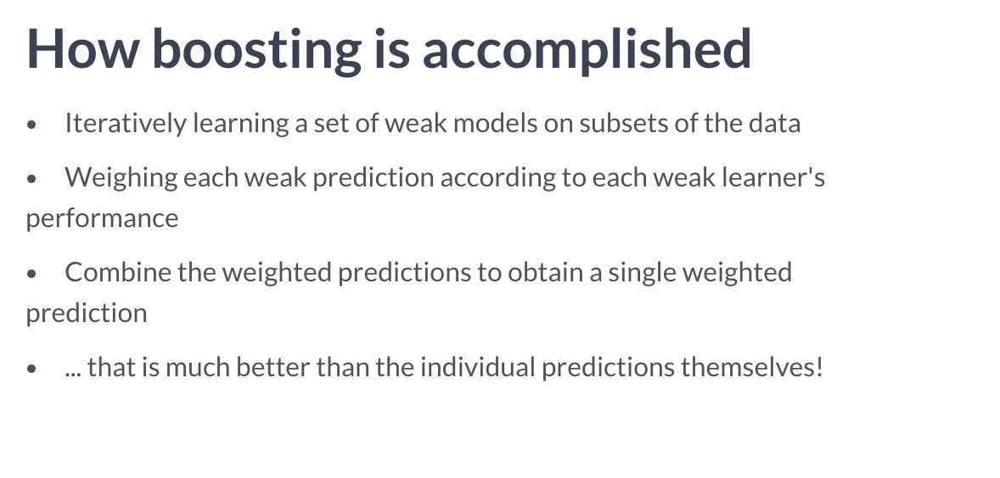

In [72]:
Image(filename= '10.png')

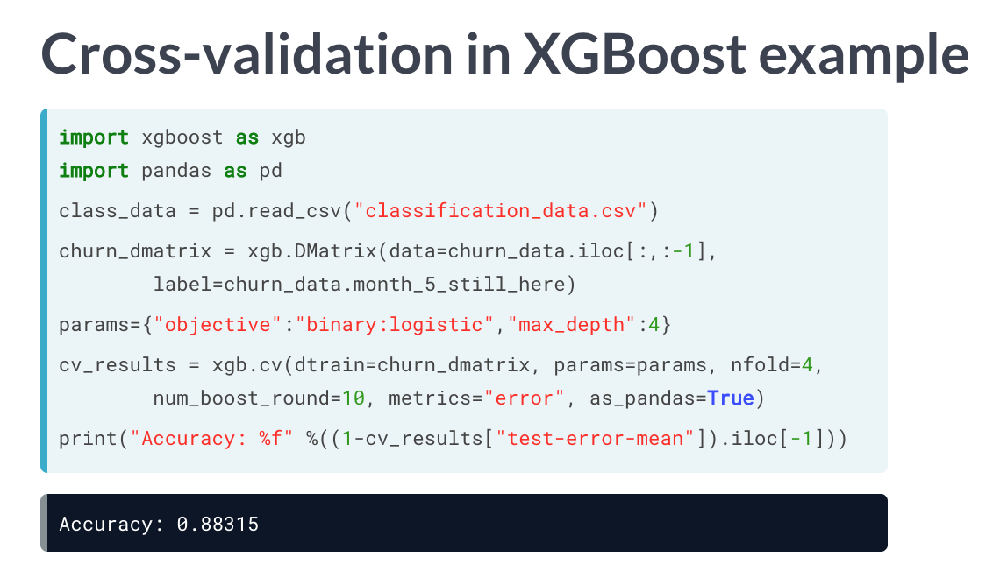

In [73]:
Image(filename= '11.png')

In [ ]:
Image(filename= '12.png')

## 5- When should I use XGBoost?


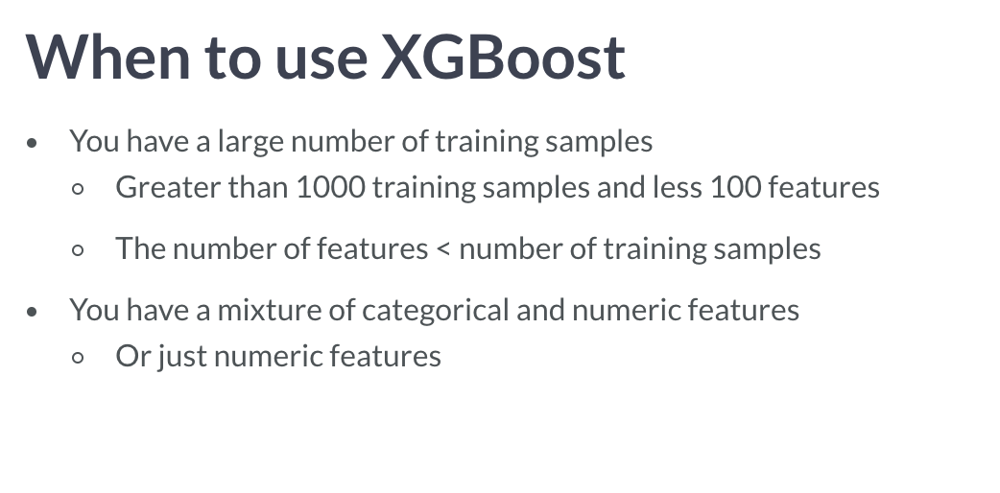

In [74]:
Image(filename= '13.png')

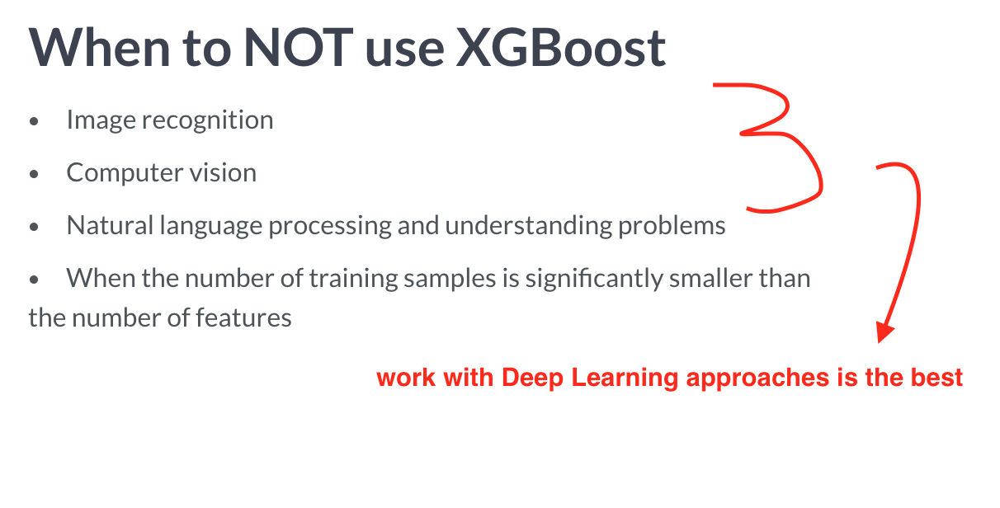

In [75]:
Image(filename= '14.png')

# 2- Regression with XGBoost

## 1- Regression review


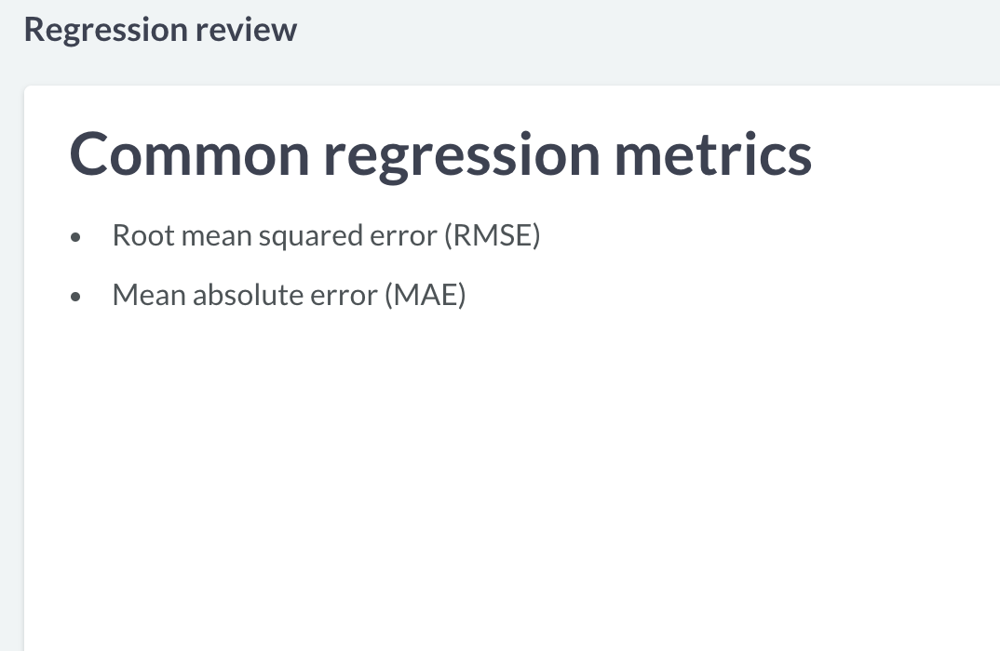

In [76]:
Image(filename= '15.png')

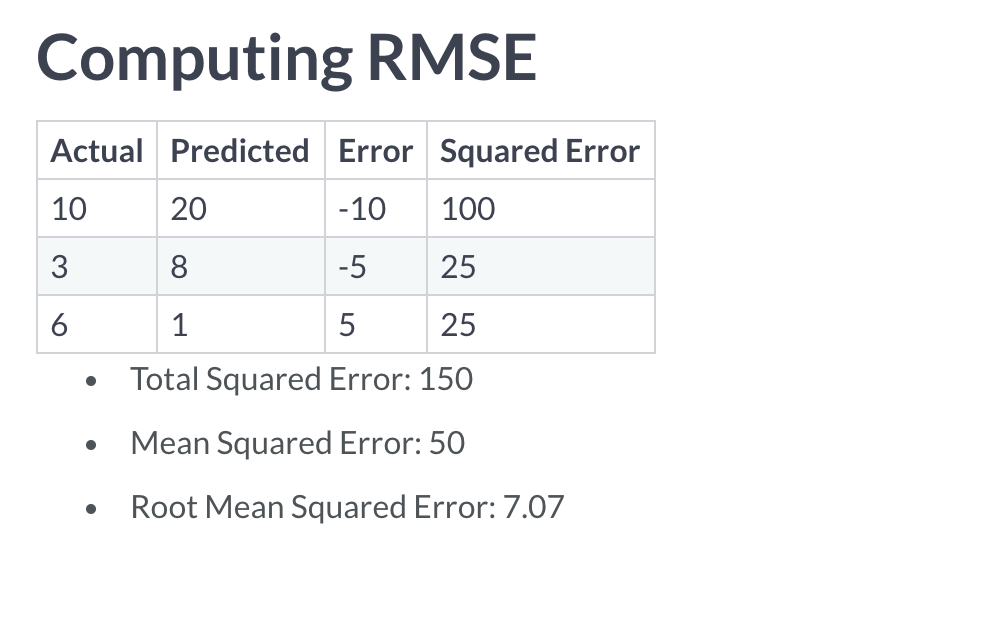

In [77]:
Image(filename= '16.png')

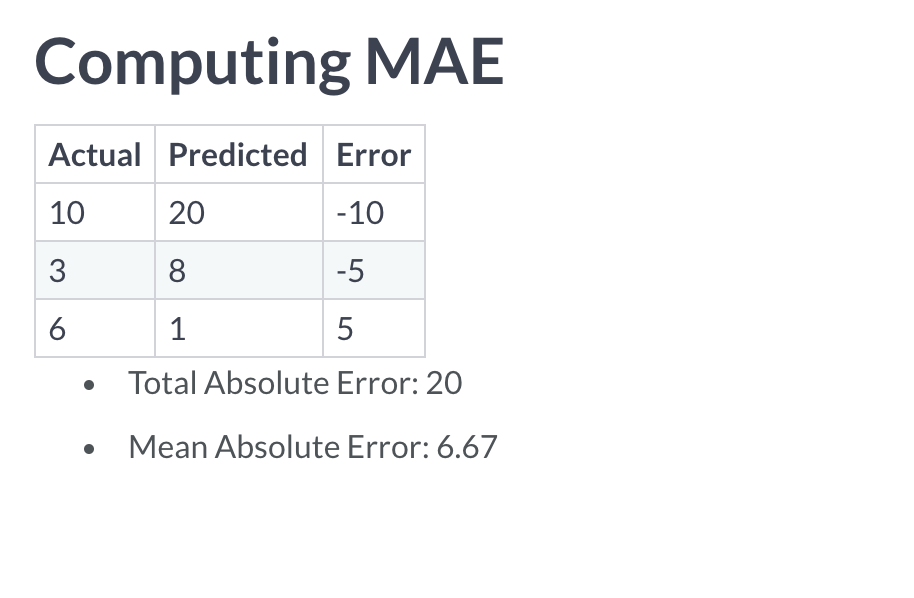

In [78]:
Image(filename= '17.png')

## 2- Objective (loss) functions and base learners


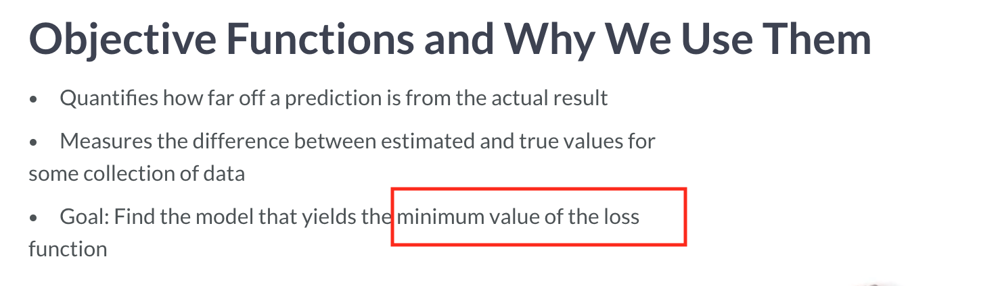

In [79]:
Image(filename= '18.png')

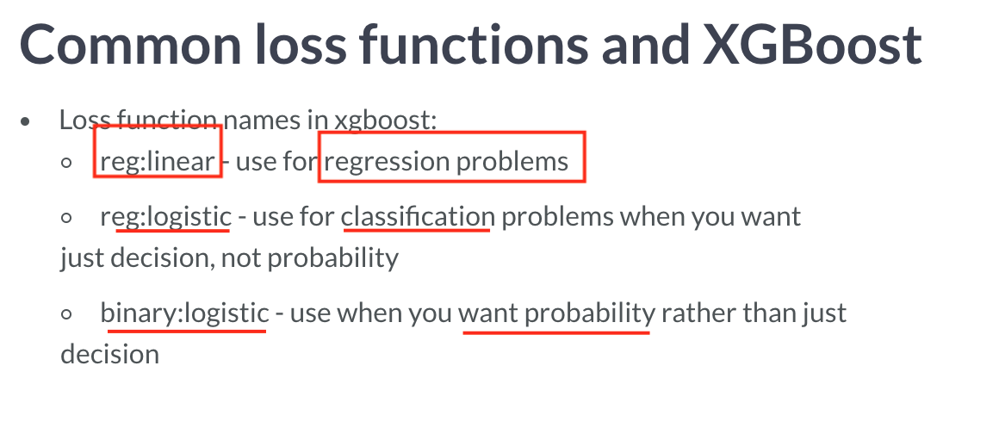

In [80]:
Image(filename= '19.png')

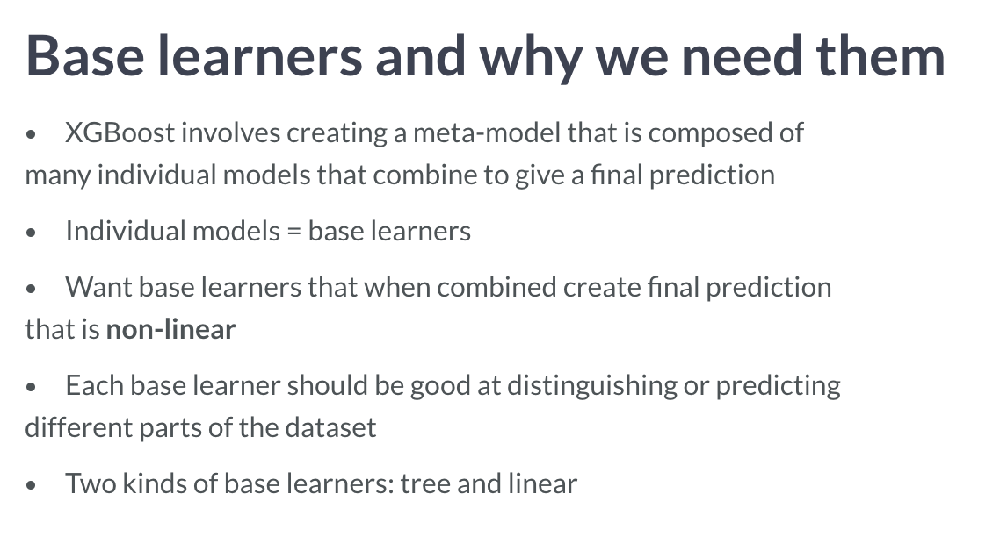

In [81]:
Image(filename= '20.png')

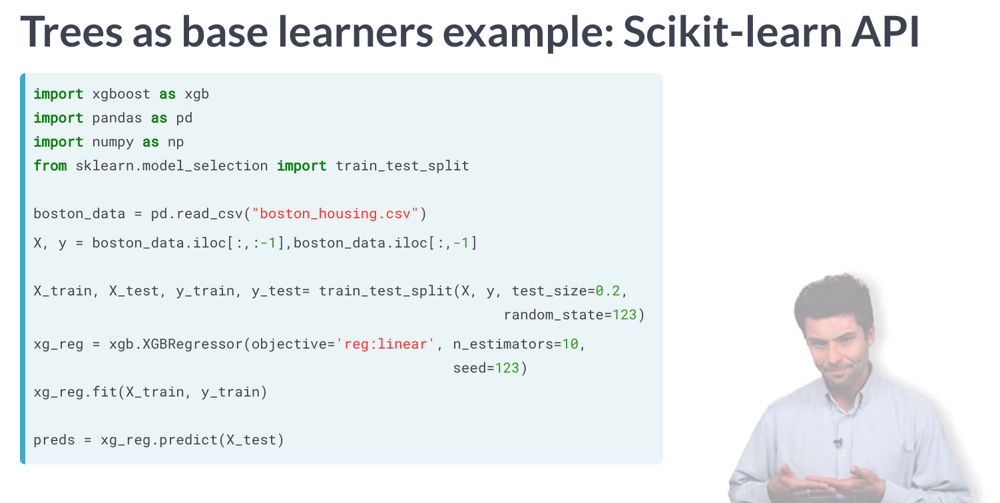

In [82]:
Image(filename= '21.png')

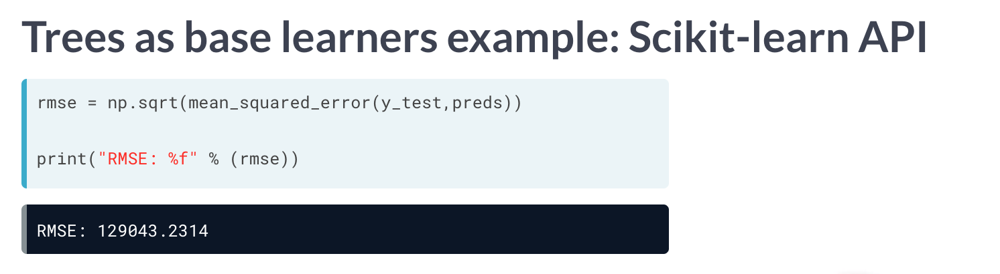

In [83]:
Image(filename= '22.png')

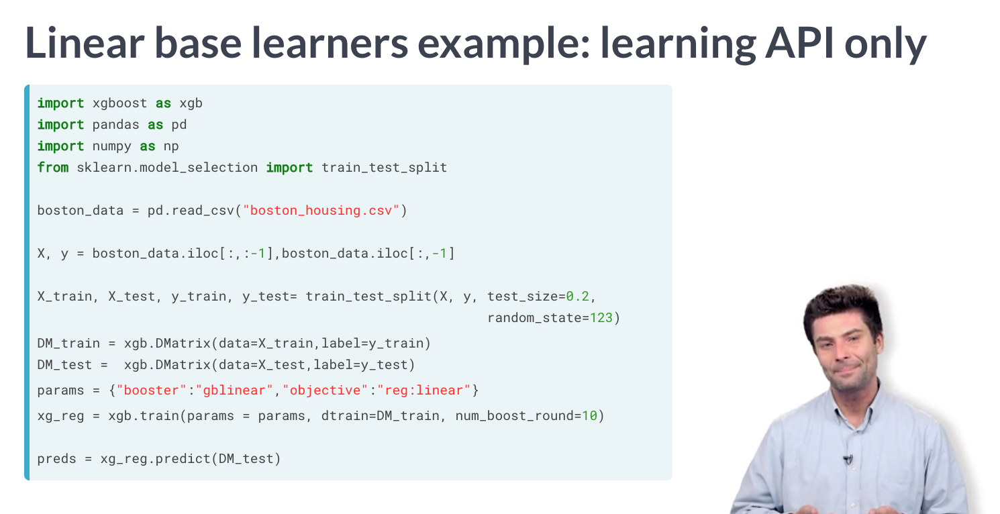

In [84]:
Image(filename= '23.png')

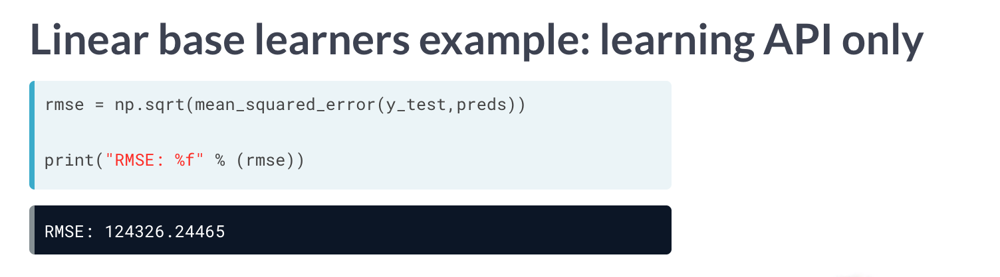

In [85]:
Image(filename= '24.png')

In [ ]:
# # Create the training and test sets
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=123)

# # Instantiate the XGBRegressor: xg_reg
# xg_reg = xgb.XGBRegressor(objective='reg:linear', n_estimators=10, booster="gbtree" , random_state=123)

# # Fit the regressor to the training set
# xg_reg.fit(X_train, y_train)

# # Predict the labels of the test set: preds
# preds = xg_reg.predict(X_test)

# # Compute the rmse: rmse
# rmse = np.sqrt(mean_squared_error(y_test, preds))
# print("RMSE: %f" % (rmse))

# RMSE: 78847.401758


In [ ]:
# # Convert the training and testing sets into DMatrixes: DM_train, DM_test
# DM_train = xgb.DMatrix(data=X_train, label= y_train)
# DM_test =  xgb.DMatrix(data=X_test, label=y_test)

# # Create the parameter dictionary: params
# params = {"booster":"gblinear", "objective":"reg:linear"}

# # Train the model: xg_reg
# xg_reg = xgb.train(dtrain = DM_train, params=params, num_boost_round=5)

# # Predict the labels of the test set: preds
# preds = xg_reg.predict(DM_test)

# # Compute and print the RMSE
# rmse = np.sqrt(mean_squared_error(y_test,preds))
# print("RMSE: %f" % (rmse))

# RMSE: 44273.783155


In [ ]:
# # Create the DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter dictionary: params
# params = {"objective":"reg:linear", "max_depth":4}

# # Perform cross-validation: cv_results
# cv_results = xgb.cv(dtrain=housing_dmatrix, params=params, nfold=4, num_boost_round=5, metrics='rmse', as_pandas=True, seed=123)

# # Print cv_results
# print(cv_results)

# # Extract and print final boosting round metric
# print((cv_results["test-rmse-mean"]).tail(1))

In [ ]:
# # Create the DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter dictionary: params
# params = {"objective":"reg:linear", "max_depth":4}

# # Perform cross-validation: cv_results
# cv_results = xgb.cv(dtrain=housing_dmatrix, params=params, nfold=4, num_boost_round=5, metrics='mae', as_pandas=True, seed=123)

# # Print cv_results
# print(cv_results)

# # Extract and print final boosting round metric
# print((cv_results["test-mae-mean"]).tail(1))

## 3- Regularization and base learners in XGBoost


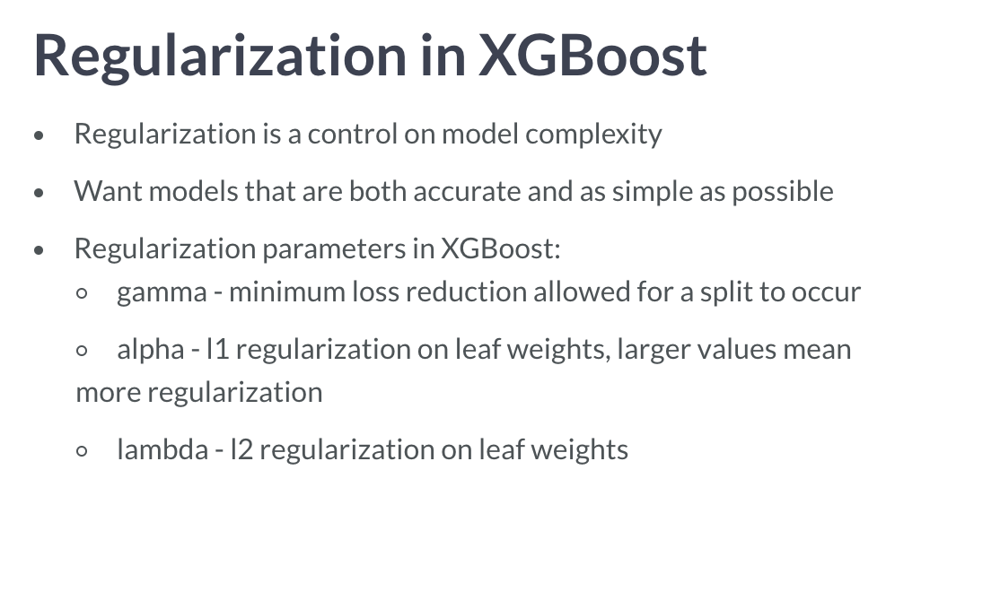

In [86]:
Image(filename= '25.png')

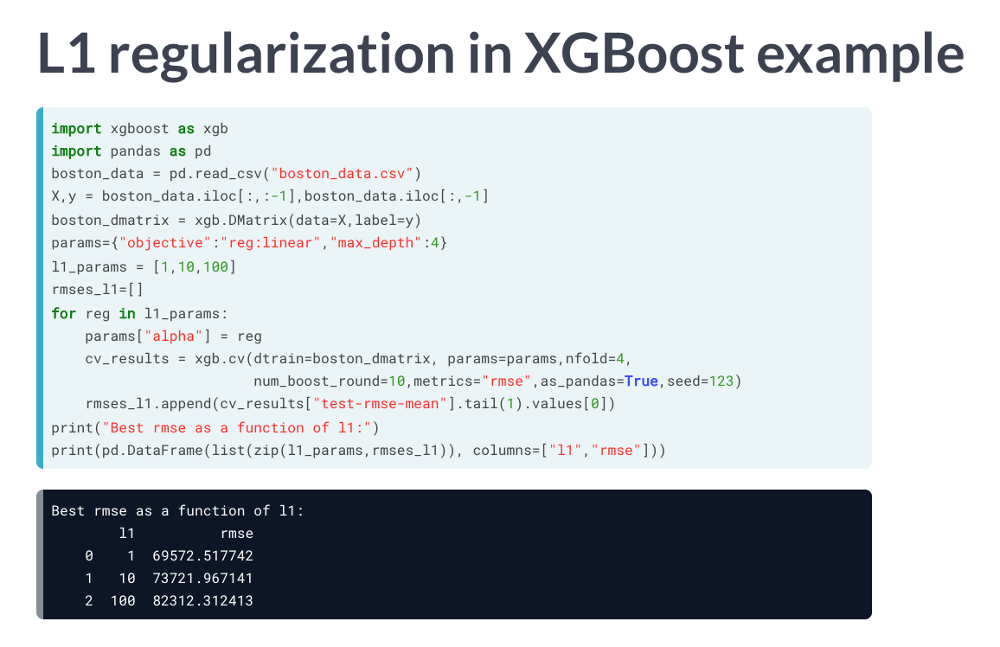

In [87]:
Image(filename= '26.png')

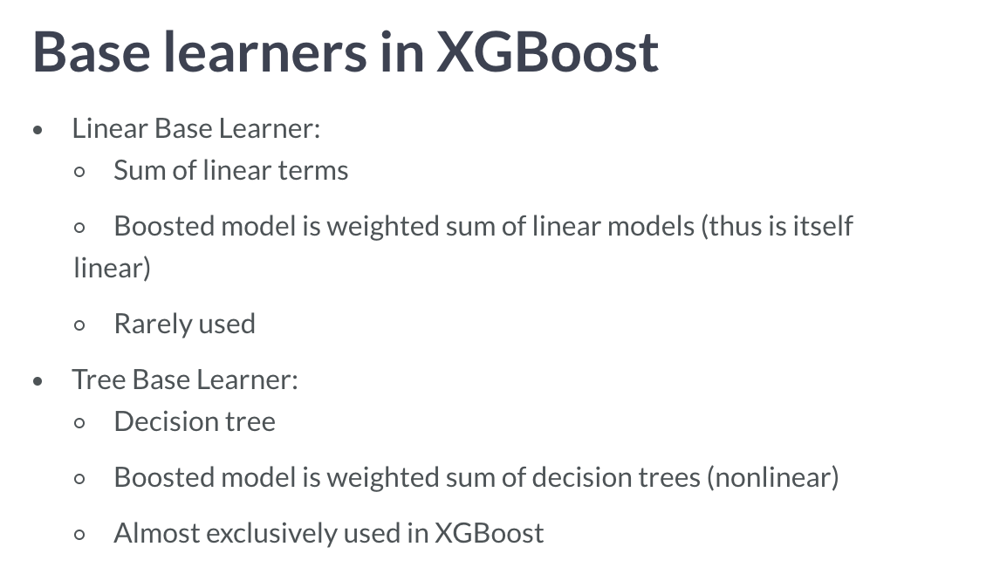

In [88]:
Image(filename= '27.png')

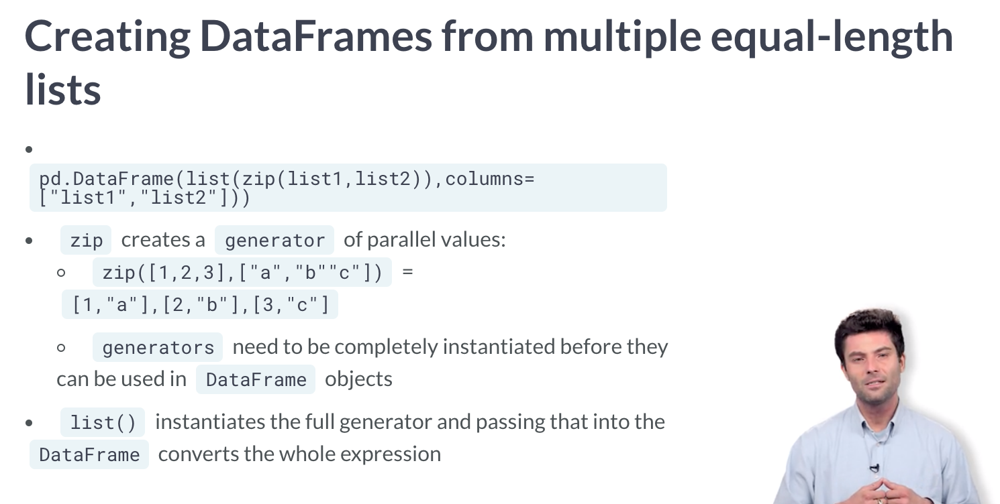

In [89]:
Image(filename= '28.png')

In [ ]:
# # Create the DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# reg_params = [1, 10, 100]

# # Create the initial parameter dictionary for varying l2 strength: params
# params = {"objective":"reg:linear","max_depth":3}

# # Create an empty list for storing rmses as a function of l2 complexity
# rmses_l2 = []

# # Iterate over reg_params
# for reg in reg_params:

#     # Update l2 strength
#     params["lambda"] = reg
    
#     # Pass this updated param dictionary into cv
#     cv_results_rmse = xgb.cv(dtrain=housing_dmatrix, params=params, nfold=2, num_boost_round=5, metrics="rmse", as_pandas=True, seed=123)
    
#     # Append best rmse (final round) to rmses_l2
#     rmses_l2.append(cv_results_rmse["test-rmse-mean"].tail(1).values[0])

# # Look at best rmse per l2 param
# print("Best rmse as a function of l2:")
# print(pd.DataFrame(list(zip(reg_params, rmses_l2)), columns=["l2", "rmse"]))


# Best rmse as a function of l2:
#     l2          rmse
# 0    1  52275.357421
# 1   10  57746.064453
# 2  100  76624.628907


In [90]:
# Create the DMatrix: housing_dmatrix
housing_dmatrix = xgb.DMatrix(data=X, label=y)

# Create the parameter dictionary: params
params = {"objective":"reg:linear", "max_depth":2}

# Train the model: xg_reg
xg_reg = xgb.train(params=params, dtrain=housing_dmatrix, num_boost_round=10)

# Plot the first tree
xgb.plot_tree(xg_reg, num_trees=0)
plt.show()

# Plot the fifth tree
xgb.plot_tree(xg_reg, num_trees=4)

plt.show()

# Plot the last tree sideways
xgb.plot_tree(xg_reg, rankdir="LR", num_trees=9)

plt.show()

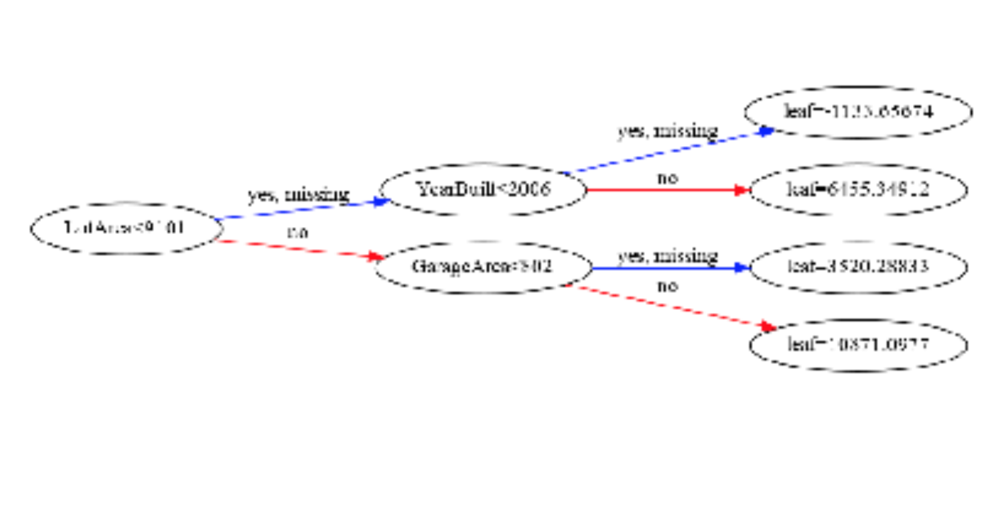

In [91]:
Image(filename= '29.png')

In [ ]:
# Create the DMatrix: housing_dmatrix
housing_dmatrix = xgb.DMatrix(data=X, label=y)

# Create the parameter dictionary: params
params = {'objective':'reg:linear', 'max_depth':4}

# Train the model: xg_reg
xg_reg = xgb.train(dtrain=housing_dmatrix, params=params, num_boost_round=10)

# Plot the feature importances
xgb.plot_importance(xg_reg)
plt.show()


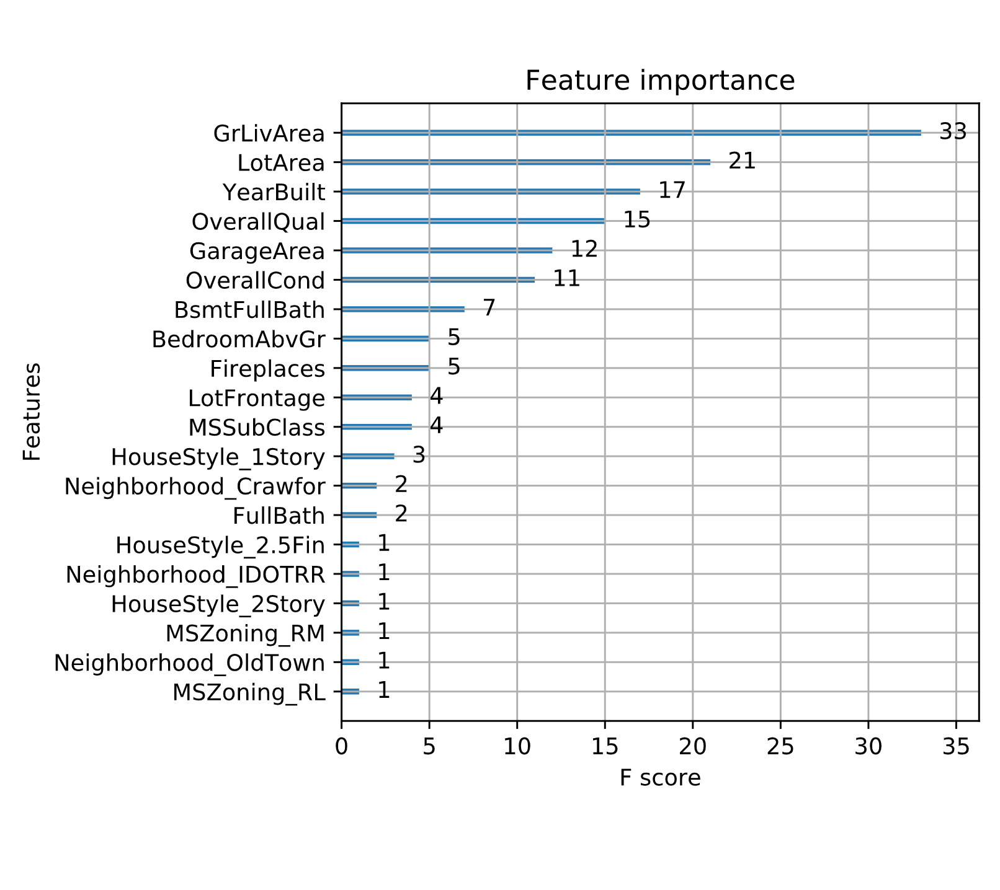

In [92]:
Image(filename= '30.png')

# 3- Fine-tuning your XGBoost model

## 1- Why tune your model?


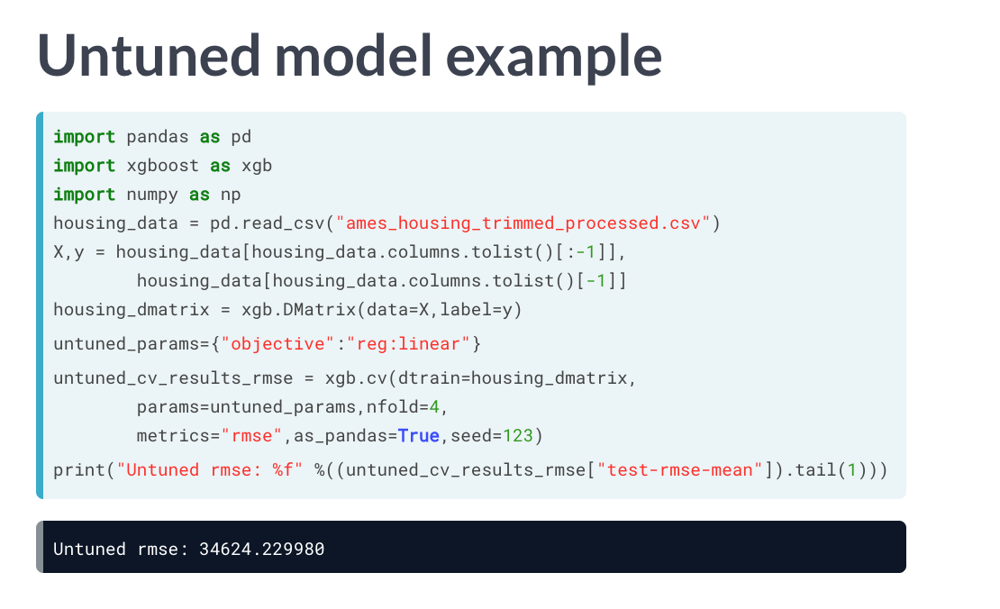

In [93]:
Image(filename= '31.png')

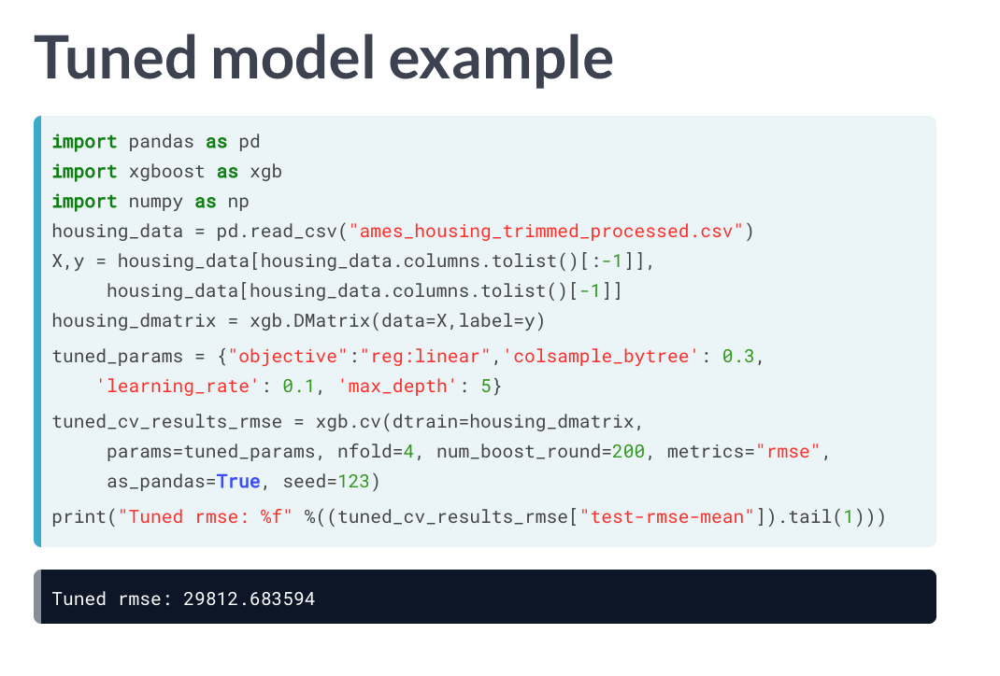

In [94]:
Image(filename= '32.png')

In [ ]:
# # Create the DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter dictionary for each tree: params 
# params = {"objective":"reg:linear", "max_depth":3}

# # Create list of number of boosting rounds
# num_rounds = [5, 10, 15]

# # Empty list to store final round rmse per XGBoost model
# final_rmse_per_round = []

# # Iterate over num_rounds and build one model per num_boost_round parameter
# for curr_num_rounds in num_rounds:

#     # Perform cross-validation: cv_results
#     cv_results = xgb.cv(dtrain=housing_dmatrix, params=params, nfold=3, num_boost_round=curr_num_rounds, metrics="rmse", as_pandas=True, seed=123)
    
#     # Append final round RMSE
#     final_rmse_per_round.append(cv_results["test-rmse-mean"].tail().values[-1])

# # Print the resultant DataFrame
# num_rounds_rmses = list(zip(num_rounds, final_rmse_per_round))
# print(pd.DataFrame(num_rounds_rmses,columns=["num_boosting_rounds","rmse"]))

#    num_boosting_rounds          rmse
# 0                    5  50903.302083
# 1                   10  34774.192708
# 2                   15  32895.096354


In [96]:
import pandas as pd
three_nums = [1, 2, 3]
another_three = [4, 5, 6]
two_ = list(zip(three_nums, another_three))
print(pd.DataFrame(two_, columns= ['three_nums', 'another_three']))

   three_nums  another_three
0           1              4
1           2              5
2           3              6


In [ ]:
# # Create your housing DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter dictionary for each tree: params
# params = {"objective":"reg:linear", "max_depth":4}

# # Perform cross-validation with early stopping: cv_results
# cv_results = xgb.cv(dtrain= housing_dmatrix, params=params, nfold=3, metrics='rmse', early_stopping_rounds=10, num_boost_round=50, seed=123, as_pandas= True)

# # Print cv_results
# print(cv_results)

## 2- Overview of XGBoost's hyperparameters

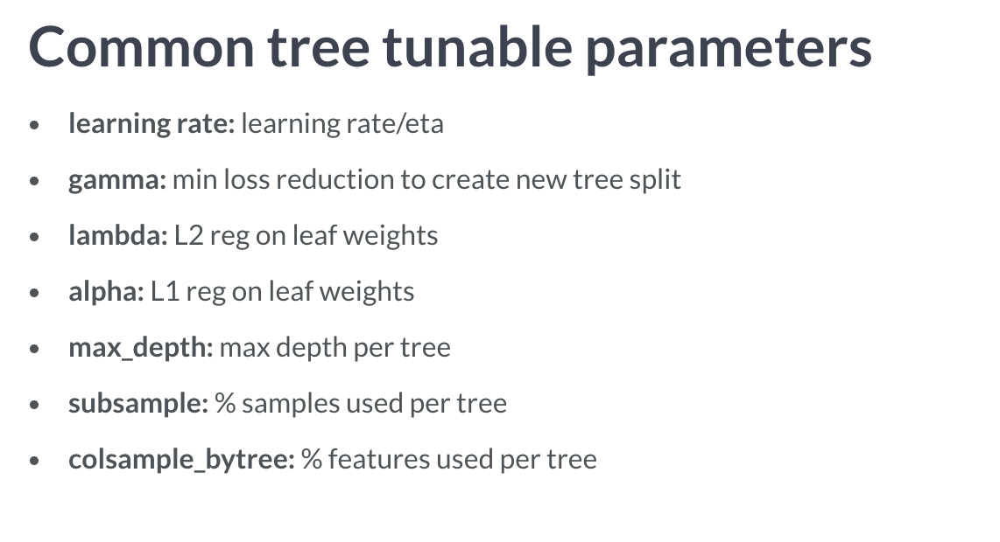

In [97]:
Image(filename= '33.png')

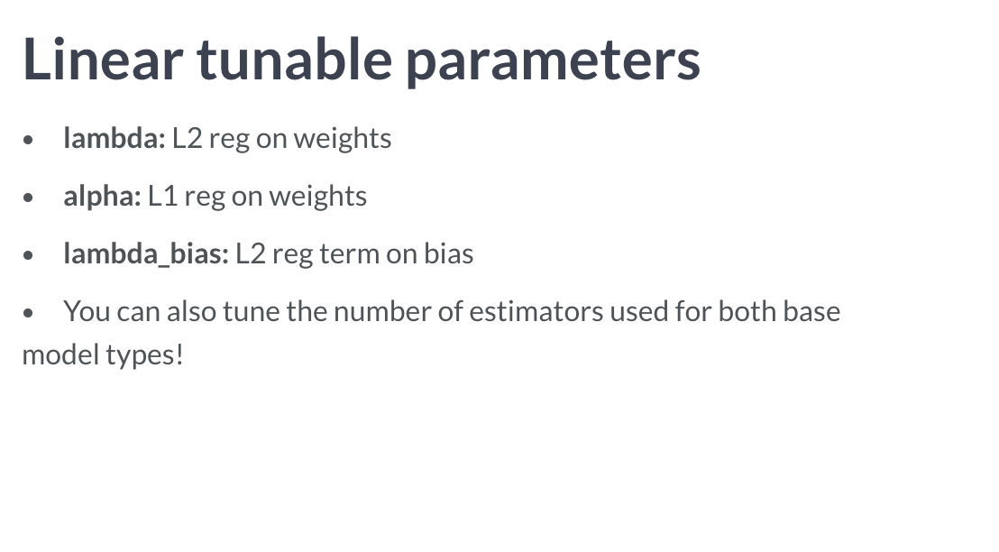

In [98]:
Image(filename= '34.png')

In [ ]:
# # Create your housing DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter dictionary for each tree (boosting round)
# params = {"objective":"reg:linear", "max_depth":3}

# # Create list of eta values and empty list to store final round rmse per xgboost model
# eta_vals = [0.001, 0.01, 0.1] #learning rate
# best_rmse = []

# # Systematically vary the eta 
# for curr_val in eta_vals:

#     params["eta"] = curr_val
    
#     # Perform cross-validation: cv_results
#     cv_results = xgb.cv(dtrain=housing_dmatrix, params= params, nfold=3, early_stopping_rounds=5, num_boost_round=10, metrics='rmse', seed=123)
    
    
    
#     # Append the final round rmse to best_rmse
#     best_rmse.append(cv_results["test-rmse-mean"].tail().values[-1])

# # Print the resultant DataFrame
# print(pd.DataFrame(list(zip(eta_vals, best_rmse)), columns=["eta","best_rmse"]))


#      eta      best_rmse
# 0  0.001  195736.401042
# 1  0.010  179932.182292
# 2  0.100   79759.414063


In [ ]:
# # Create your housing DMatrix
# housing_dmatrix = xgb.DMatrix(data=X,label=y)

# # Create the parameter dictionary
# params = {"objective":"reg:linear"}

# # Create list of max_depth values
# max_depths = [2, 5, 10, 20]
# best_rmse = []

# # Systematically vary the max_depth
# for curr_val in max_depths:

#     params["max_depth"] = curr_val
    
#     # Perform cross-validation
#     cv_results = xgb.cv(dtrain=housing_dmatrix, params= params, nfold=2, early_stopping_rounds=5, num_boost_round=10, metrics='rmse', seed= 123)
    
    
    
#     # Append the final round rmse to best_rmse
#     best_rmse.append(cv_results["test-rmse-mean"].tail().values[-1])

# # Print the resultant DataFrame
# print(pd.DataFrame(list(zip(max_depths, best_rmse)),columns=["max_depth","best_rmse"]))

#    max_depth     best_rmse
# 0          2  37957.468750
# 1          5  35596.601562
# 2         10  36065.546875
# 3         20  36739.578125


In [ ]:
# # Create your housing DMatrix
# housing_dmatrix = xgb.DMatrix(data=X,label=y)

# # Create the parameter dictionary
# params={"objective":"reg:linear","max_depth":3}

# # Create list of hyperparameter values: colsample_bytree_vals
# colsample_bytree_vals = [0.1, 0.5, 0.8,1]
# best_rmse = []

# # Systematically vary the hyperparameter value 
# for curr_val in colsample_bytree_vals:

#     params['colsample_bytree'] = curr_val
    
#     # Perform cross-validation
#     cv_results = xgb.cv(dtrain=housing_dmatrix, params=params, nfold=2,
#                  num_boost_round=10, early_stopping_rounds=5,
#                  metrics="rmse", as_pandas=True, seed=123)
    
#     # Append the final round rmse to best_rmse
#     best_rmse.append(cv_results["test-rmse-mean"].tail().values[-1])

# # Print the resultant DataFrame
# print(pd.DataFrame(list(zip(colsample_bytree_vals, best_rmse)), columns=["colsample_bytree","best_rmse"]))

#    colsample_bytree     best_rmse
# 0               0.1  35836.042969
# 1               0.5  35836.042969
# 2               0.8  35836.042969
# 3               1.0  35836.042969


In [ ]:
# # i made all in one code!
# # Create your housing DMatrix
# housing_dmatrix = xgb.DMatrix(data=X,label=y)

# # Create the parameter dictionary
# params={"objective":"reg:linear"}

# # Create list of hyperparameter values: colsample_bytree_vals

# eta_vals = [0.001, 0.01, 0.1, 1] #learning rate
# max_depths = [2, 5, 10, 20]
# colsample_bytree_vals = [0.1, 0.5, 0.8,1]
# best_rmse = []

# # Systematically vary the hyperparameter value 
# for curr_val in range(4):
#     params["max_depth"] = max_depths[curr_val]
#     params["eta"]       = eta_vals[curr_val]
#     params['colsample_bytree']  = colsample_bytree_vals[curr_val]
    
    
#     # Perform cross-validation
#     cv_results = xgb.cv(dtrain=housing_dmatrix, params=params, nfold=2,
#                  num_boost_round=10, early_stopping_rounds=5,
#                  metrics="rmse", as_pandas=True, seed=123)
    
#     # Append the final round rmse to best_rmse
#     best_rmse.append(cv_results["test-rmse-mean"].tail().values[-1])

# # Print the resultant DataFrame
# print(pd.DataFrame(list(zip(max_depths, eta_vals, colsample_bytree_vals, best_rmse)), columns=["max_depth","eta",  "colsample_bytree","best_rmse"]))

#    max_depth    eta  colsample_bytree      best_rmse
# 0          2  0.001               0.1  195841.351562
# 1          5  0.010               0.5  180215.195312
# 2         10  0.100               0.8   79572.972657
# 3         20  1.000               1.0   42752.431641



## 3- Review of grid search and random search


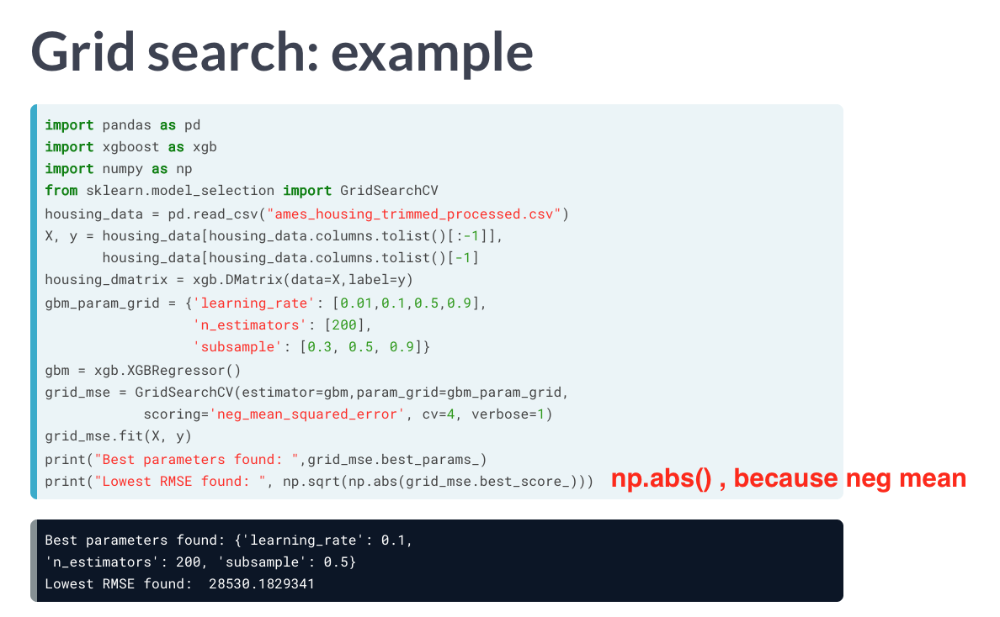

In [104]:
Image(filename= '35.png')

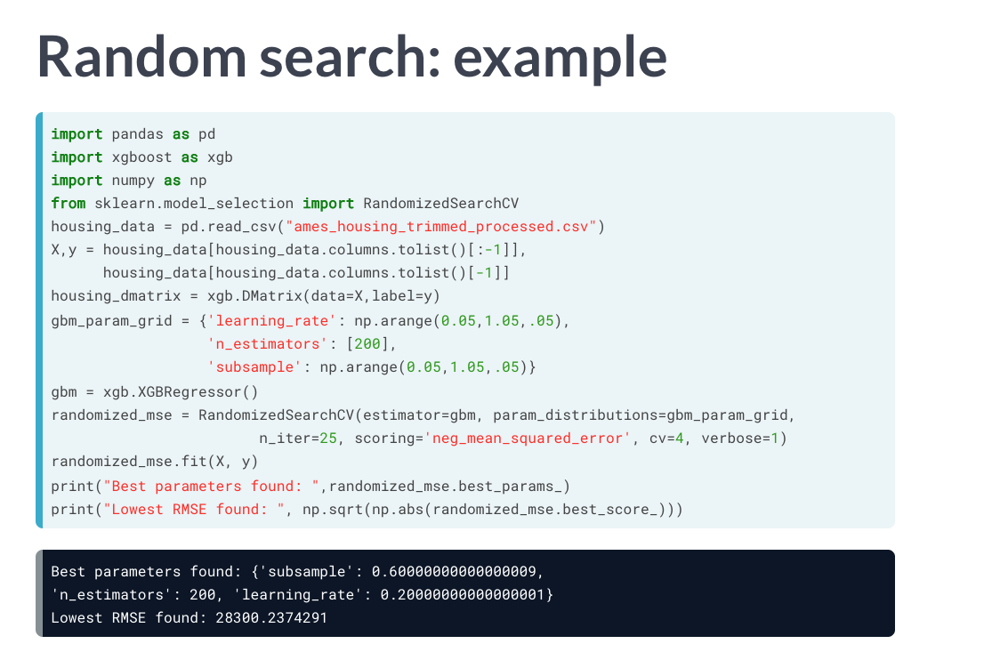

In [105]:
Image(filename= '36.png')

In [ ]:
# # Create your housing DMatrix: housing_dmatrix
# housing_dmatrix = xgb.DMatrix(data=X, label=y)

# # Create the parameter grid: gbm_param_grid
# gbm_param_grid = {
#     'colsample_bytree': [0.3, 0.7],
#     'n_estimators': [50],
#     'max_depth': [2, 5]
# }

# # Instantiate the regressor: gbm
# gbm = xgb.XGBRegressor()

# # Perform grid search: grid_mse
# grid_mse = GridSearchCV(estimator=gbm, param_grid= gbm_param_grid, scoring='neg_mean_squared_error', cv= 4, verbose=1)


# # Fit grid_mse to the data
# grid_mse.fit(X, y)

# # Print the best parameters and lowest RMSE
# print("Best parameters found: ", grid_mse.best_params_)
# print("Lowest RMSE found: ", np.sqrt(np.abs(grid_mse.best_score_)))


# Best parameters found:  {'colsample_bytree': 0.7, 'max_depth': 5, 'n_estimators': 50}
# Lowest RMSE found:  29916.562522854438


In [106]:
# # Create the parameter grid: gbm_param_grid 
# gbm_param_grid = {
#     'n_estimators': [25],
#     'max_depth': np.arange(2, 11)
# }

# # Instantiate the regressor: gbm
# gbm = xgb.XGBRegressor(n_estimators=10)

# # Perform random search: grid_mse
# randomized_mse = RandomizedSearchCV(
#     estimator= gbm, param_distributions=gbm_param_grid, scoring='neg_mean_squared_error', n_iter=5, verbose=1
#     )


# # Fit randomized_mse to the data
# randomized_mse.fit(X, y)

# # Print the best parameters and lowest RMSE
# print("Best parameters found: ", randomized_mse.best_params_)
# print("Lowest RMSE found: ", np.sqrt(np.abs(randomized_mse.best_score_)))


# Best parameters found:  {'n_estimators': 25, 'max_depth': 5}
# Lowest RMSE found:  35708.718300651795


[2 3 4 5]


## 4- Limits of grid search and random search


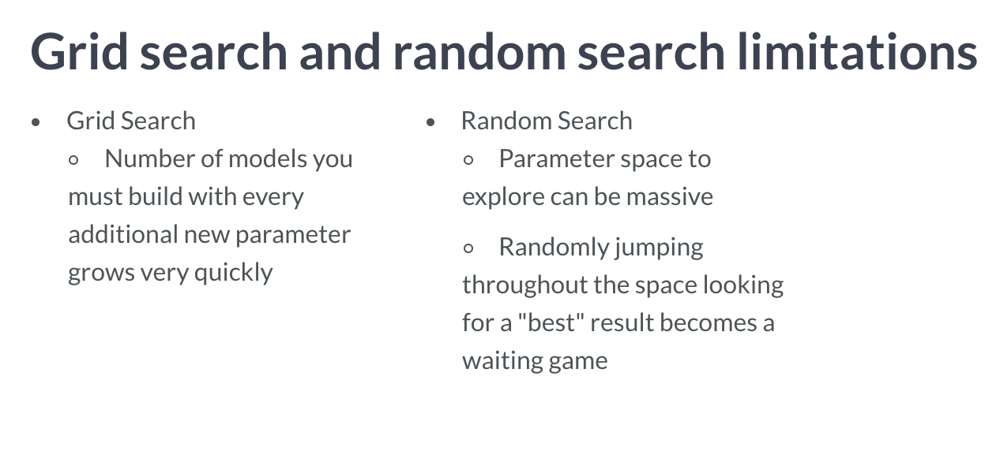

In [107]:
Image(filename= '37.png')

# 4- Using XGBoost in pipelines

# 1- Review of pipelines using sklearn


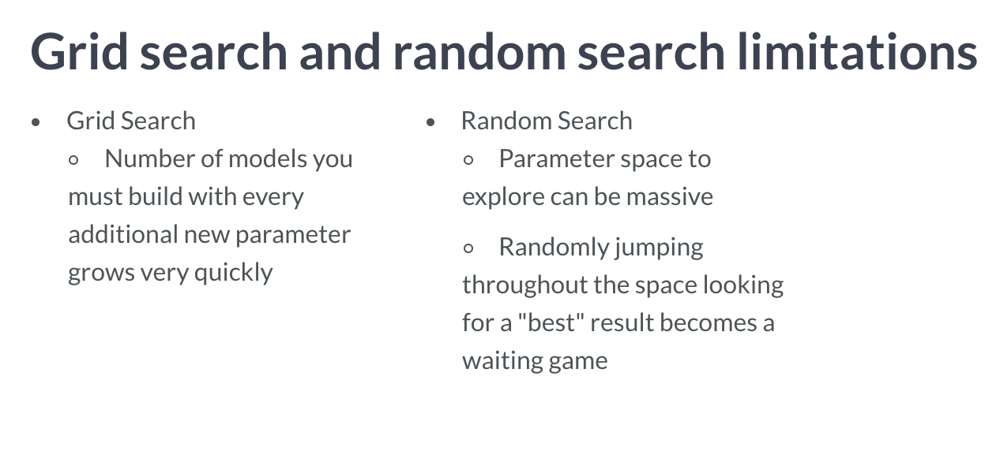

In [108]:
Image(filename= '37.png')

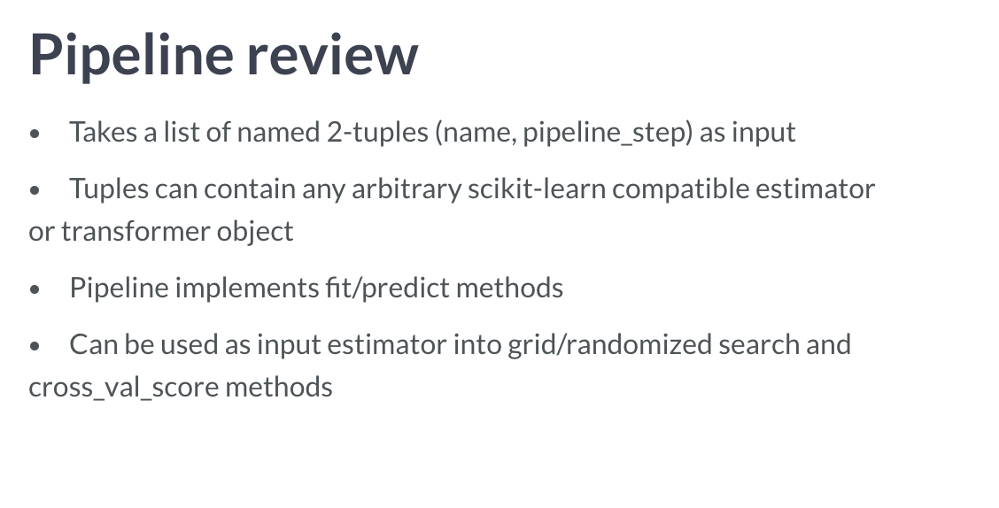

In [109]:
Image(filename= '38.png')

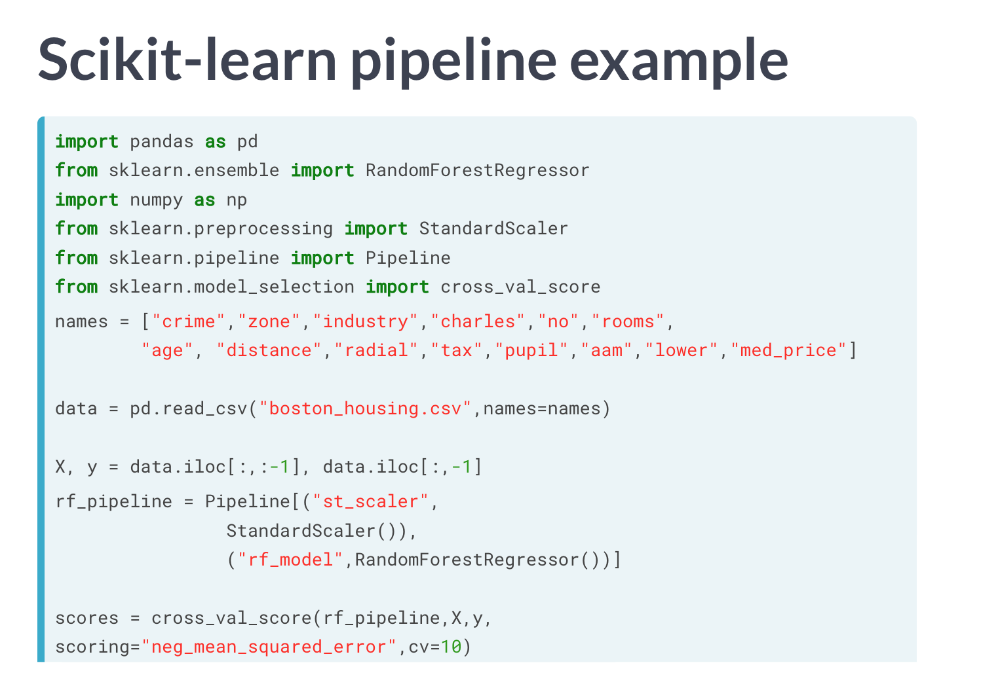

In [110]:
Image(filename= '39.png')

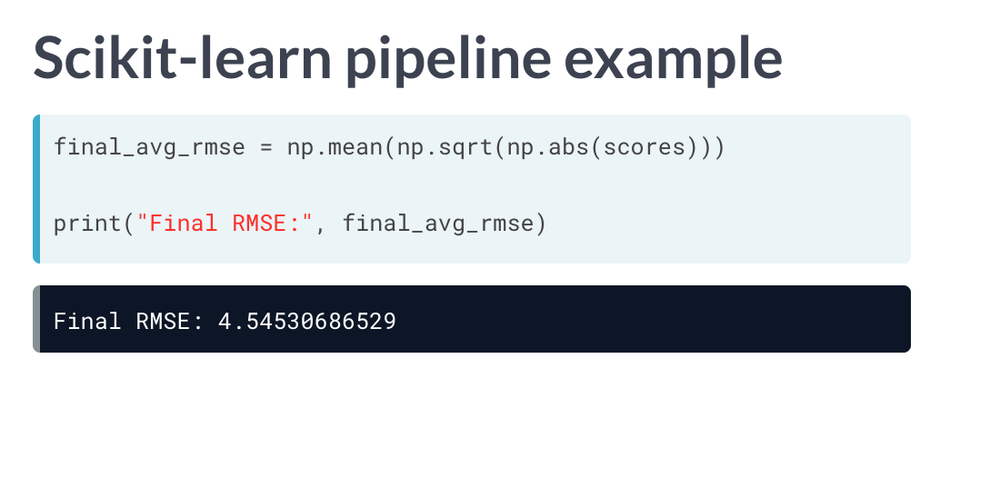

In [111]:
Image(filename= '40.png')

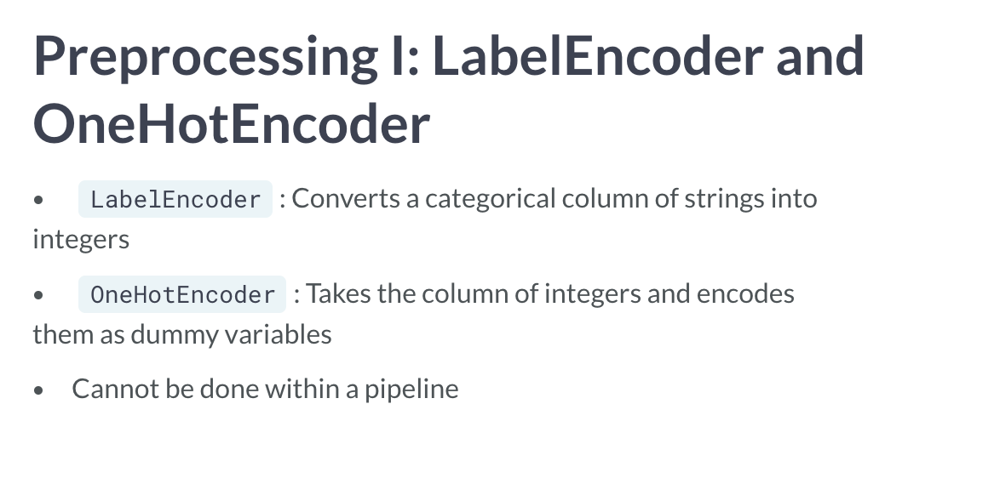

In [112]:
Image(filename= '41.png')

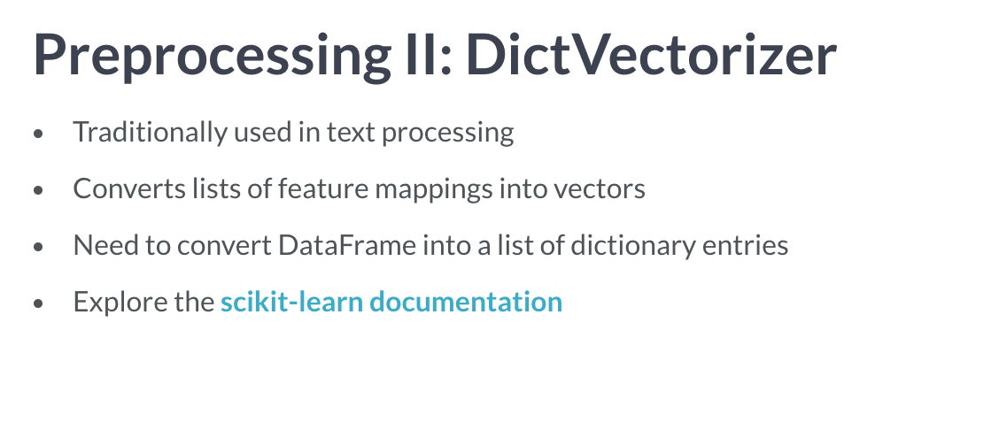

In [113]:
Image(filename= '42.png')

In [ ]:
# # Import LabelEncoder
# from sklearn.preprocessing import LabelEncoder

# # Fill missing values with 0
# df.LotFrontage = df.LotFrontage.fillna(0) #Replace all NaN elements with 0s.



# # Create a boolean mask for categorical columns
# categorical_mask = (df.dtypes == object)

# # Get list of categorical column names
# categorical_columns = df.columns[categorical_mask].tolist()

# # Print the head of the categorical columns
# print(df[categorical_columns].head())

# # Create LabelEncoder object: le
# le = LabelEncoder()

# # Apply LabelEncoder to categorical columns
# df[categorical_columns] = df[categorical_columns].apply(lambda x: le.fit_transform(x))

# # Print the head of the LabelEncoded categorical columns
# print(df[categorical_columns].head())

In [129]:
df = pd.DataFrame([[np.nan, 2, np.nan, 0],
                    [3, 4, np.nan, 1],
                    [np.nan, np.nan, np.nan, 5],
                    [np.nan, 3, np.nan, 4]],
                   columns=list('ABCD'))
print(df)
df.fillna(0, inplace= True)
print(df)

     A    B   C  D
0  NaN  2.0 NaN  0
1  3.0  4.0 NaN  1
2  NaN  NaN NaN  5
3  NaN  3.0 NaN  4
     A    B    C  D
0  0.0  2.0  0.0  0
1  3.0  4.0  0.0  1
2  0.0  0.0  0.0  5
3  0.0  3.0  0.0  4


In [ ]:
# # Import OneHotEncoder
# from sklearn.preprocessing import OneHotEncoder

# # Create OneHotEncoder: ohe
# ohe = OneHotEncoder(categorical_features=categorical_mask ,sparse=False )

# # Apply OneHotEncoder to categorical columns - output is no longer a dataframe: df_encoded
# df_encoded = ohe.fit_transform(df)

# # Print first 5 rows of the resulting dataset - again, this will no longer be a pandas dataframe
# print(df_encoded[:5, :])

# # Print the shape of the original DataFrame
# print(df.shape)

# # Print the shape of the transformed array
# print(df_encoded.shape)




In [ ]:
# # Import DictVectorizer
# from sklearn.feature_extraction import DictVectorizer

# # Convert df into a dictionary: df_dict
# df_dict = df.to_dict('records')

# # Create the DictVectorizer object: dv
# dv = DictVectorizer(sparse=False)

# # Apply dv on df: df_encoded
# df_encoded = dv.fit_transform(df_dict)

# # Print the resulting first five rows
# print(df_encoded[:5,:])

# # Print the vocabulary
# print(dv.vocabulary_)



In [ ]:
# # Import necessary modules
# from sklearn.feature_extraction import DictVectorizer
# from sklearn.pipeline import Pipeline

# # Fill LotFrontage missing values with 0
# X.LotFrontage = X.LotFrontage.fillna(0)

# # Setup the pipeline steps: steps
# steps = [("ohe_onestep", DictVectorizer(sparse=False)),
#          ("xgb_model", xgb.XGBRegressor())]

# # Create the pipeline: xgb_pipeline
# xgb_pipeline = Pipeline(steps)

# # Fit the pipeline
# xgb_pipeline.fit(X.to_dict("records"), y)



## 2- Incorporating XGBoost into pipelines


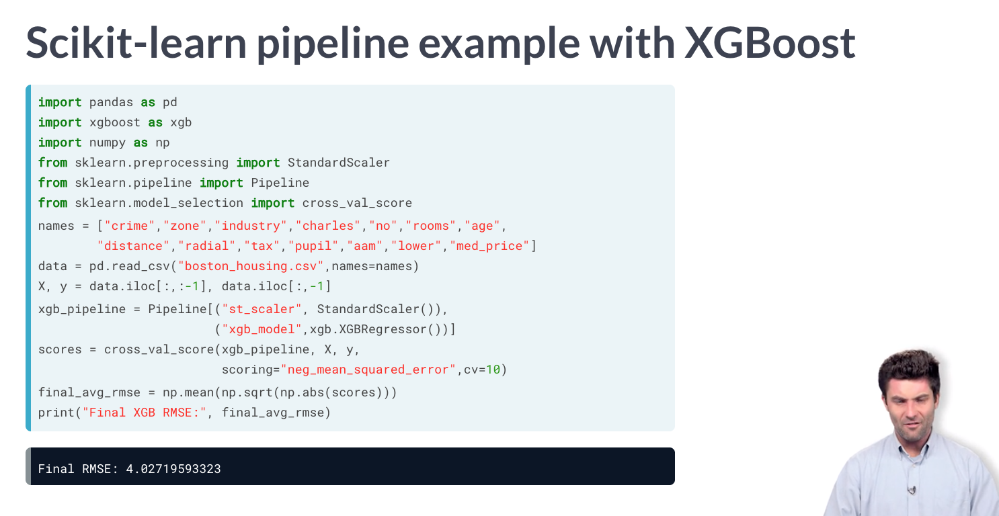

In [130]:
Image(filename= '43.png')

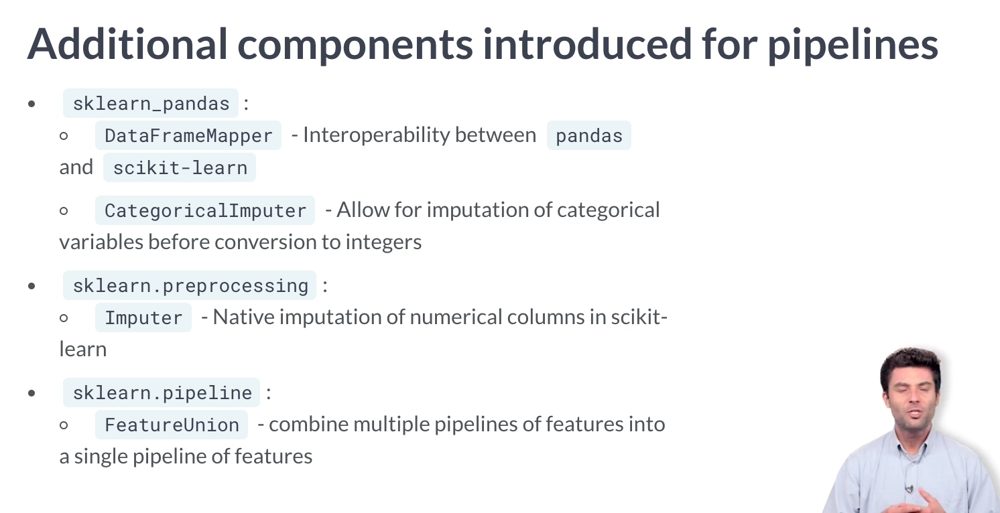

In [131]:
Image(filename= '44.png')

In [ ]:
# # Import necessary modules
# from sklearn.feature_extraction import DictVectorizer
# from sklearn.pipeline import Pipeline
# from sklearn.model_selection import cross_val_score

# # Fill LotFrontage missing values with 0
# X.LotFrontage = X.LotFrontage.fillna(0)

# # Setup the pipeline steps: steps
# steps = [("ohe_onestep", DictVectorizer(sparse=False)),
#          ("xgb_model", xgb.XGBRegressor(max_depth=2, objective="reg:linear"))]

# # Create the pipeline: xgb_pipeline
# xgb_pipeline = Pipeline(steps)

# # Cross-validate the model
# cross_val_scores = cross_val_score(xgb_pipeline, X.to_dict('records'), y, scoring= 'neg_mean_squared_error', cv=10)

# # Print the 10-fold RMSE
# print("10-fold RMSE: ", np.mean(np.sqrt(np.abs(cross_val_scores))))

# 10-fold RMSE:  29867.603720688923


In [ ]:
# Import necessary modules
from sklearn_pandas import DataFrameMapper
from sklearn_pandas import CategoricalImputer

# Check number of nulls in each feature column
nulls_per_column = X.isnull().sum()
print(nulls_per_column)

# Create a boolean mask for categorical columns
categorical_feature_mask = X.dtypes == object

# Get list of categorical column names
categorical_columns = X.columns[categorical_feature_mask].tolist()

# Get list of non-categorical column names
non_categorical_columns = X.columns[~categorical_feature_mask].tolist()

# Apply numeric imputer
numeric_imputation_mapper = DataFrameMapper(
                                            [([numeric_feature],Imputer(strategy="median")) for numeric_feature in non_categorical_columns],
                                            input_df=True,
                                            df_out=True
                                           )

# Apply categorical imputer
categorical_imputation_mapper = DataFrameMapper(
                                                [(category_feature, CategoricalImputer()) for category_feature in categorical_columns],
                                                input_df=True,
                                                df_out=True
                                               )

In [ ]:
# Import FeatureUnion
from sklearn.pipeline import FeatureUnion

# Combine the numeric and categorical transformations
numeric_categorical_union = FeatureUnion([
                                          ("num_mapper", numeric_imputation_mapper),
                                          ("cat_mapper", categorical_imputation_mapper)
                                         ])

In [ ]:
# Create full pipeline
pipeline = Pipeline([
                     ("featureunion", numeric_categorical_union),
                     ("dictifier", Dictifier()),
                     ("vectorizer", DictVectorizer(sort=False)),
                     ("clf", xgb.XGBClassifier(max_depth=3))
                    ])

# Perform cross-validation
cross_val_scores = cross_val_score(pipeline, kidney_data, y, scoring="roc_auc", cv=3)

# Print avg. AUC
print("3-fold AUC: ", np.mean(cross_val_scores))

3-fold AUC:  0.998637406769937

        

## 3- Tuning XGBoost hyperparameters


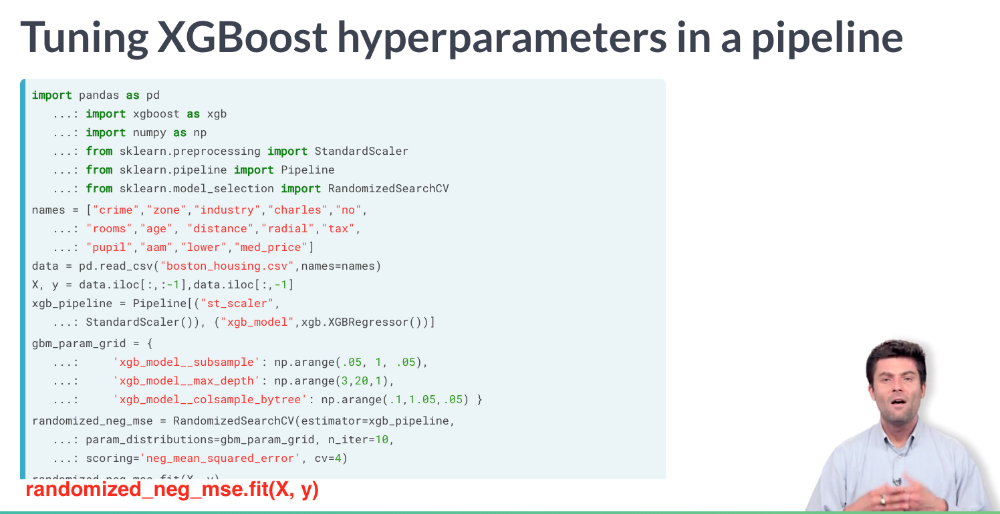

In [132]:
Image(filename= '45.png')

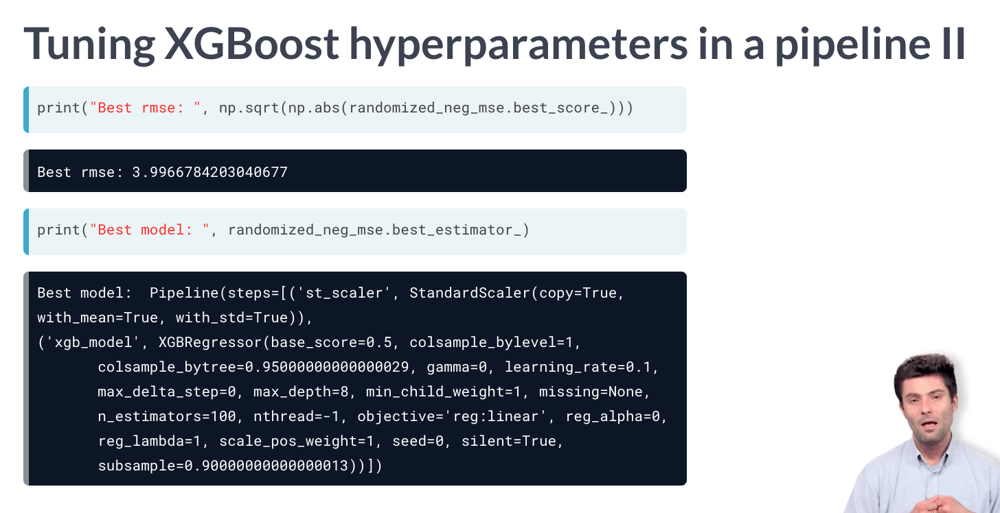

In [133]:
Image(filename= '46.png')

In [ ]:
# # Create the parameter grid
# gbm_param_grid = {
#     'clf__learning_rate': np.arange(0.05, 1, 0.05),
#     'clf__max_depth': np.arange(3, 10, 1),
#     'clf__n_estimators':np.arange(50, 200, 50)
# }

# # Perform RandomizedSearchCV
# randomized_roc_auc = RandomizedSearchCV(estimator=pipeline, param_distributions=gbm_param_grid,cv=2 ,n_iter=2, scoring='roc_auc', verbose=1)

# # Fit the estimator
# randomized_roc_auc.fit(X, y)

# # Compute metrics
# print(randomized_roc_auc.best_score_)
# print(randomized_roc_auc.best_estimator_)

## 4- Final Thoughts


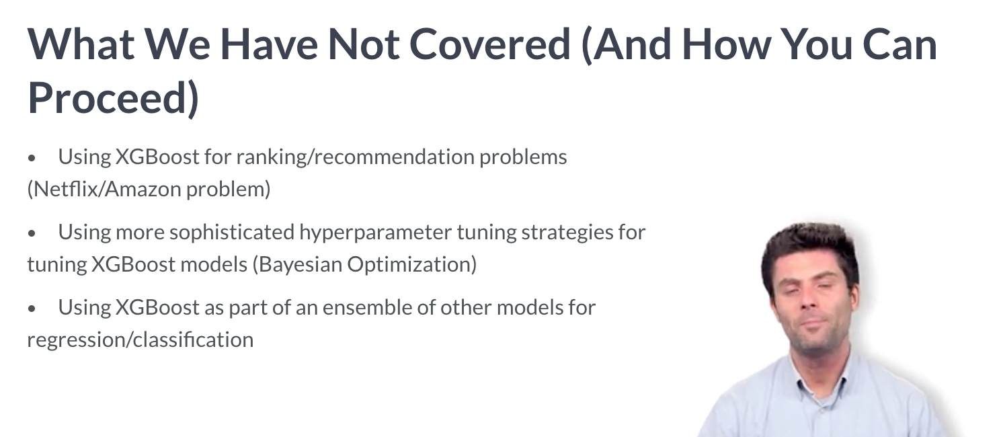

In [134]:
Image(filename= '47.png')

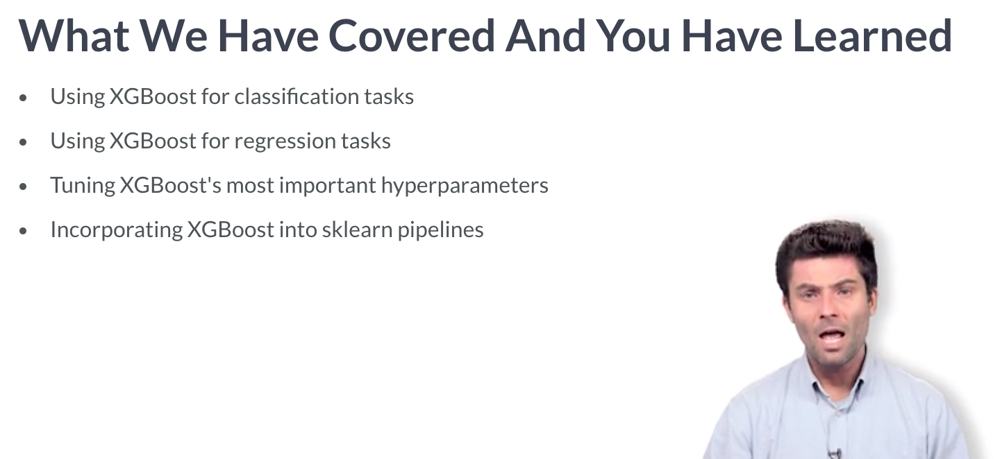

In [135]:
Image(filename= '48.png')